# XMM-LSS master catalogue
## Checks and diagnostics

In [1]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))

This notebook was run with herschelhelp_internal version: 
33f5ec7 (Wed Dec 6 16:56:17 2017 +0000)


In [2]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3

from herschelhelp_internal.masterlist import (nb_compare_mags, nb_ccplots, nb_histograms, 
                                              quick_checks, find_last_ml_suffix)

In [3]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = find_last_ml_suffix()
#SUFFIX = "20171016"

master_catalogue_filename = "master_catalogue_xmm-lss_{}.fits".format(SUFFIX)
master_catalogue = Table.read("{}/{}".format(OUT_DIR, master_catalogue_filename))

print("Diagnostics done using: {}".format(master_catalogue_filename))

Diagnostics done using: master_catalogue_xmm-lss_20180111.fits


## 0 - Quick checks

In [4]:
quick_checks(master_catalogue).show_in_notebook()

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(424, False) will return an array of dtype('bool')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)
/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/core/numeric.py:301: FutureWarning: in the future, full(424, 0) will return an array of dtype('int64')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)


Table shows only problematic columns.


idx,Column,All nan,#Measurements,#Zeros,#Negative,Minimum value
0,f_candels_f140w,False,8702128,0,513,-0.231363683939
1,f_candels_f606w,False,8709081,0,998,-0.180758431554
2,f_candels_f814w,False,8708988,0,431,-0.20426915586
3,f_candels_f125w,False,8717182,0,37,-0.0361542291939
4,merr_candels_f140w,False,28664,0,513,-1637.51550293
5,merr_candels_f606w,False,35617,0,998,-1656.55322266
6,m_ap_candels_f606w,True,0,0,0,0.0
7,merr_ap_candels_f606w,True,0,0,0,0.0
8,f_ap_candels_f606w,True,0,0,0,0.0
9,ferr_ap_candels_f606w,True,0,0,0,0.0


## I - Summary of wavelength domains

In [5]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

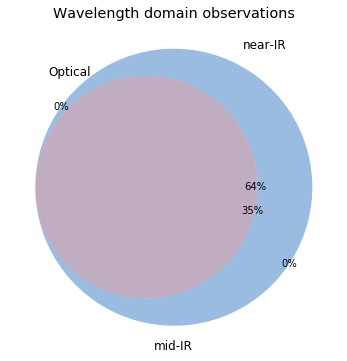

In [6]:
venn3(
    [
        np.sum(flag_obs == 4),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 6),
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 5),
        np.sum(flag_obs == 3),
        np.sum(flag_obs == 7)
    ],
    set_labels=('Optical', 'near-IR', 'mid-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

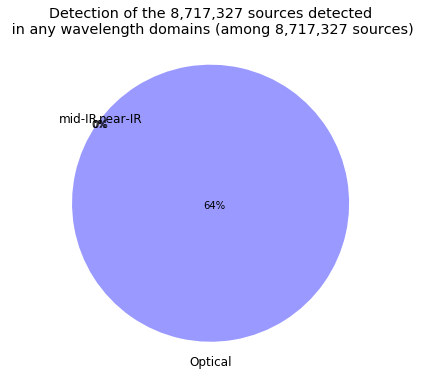

In [7]:
venn3(
    [
        np.sum(flag_det[flag_obs == 7] == 4),
        np.sum(flag_det[flag_obs == 7] == 2),
        np.sum(flag_det[flag_obs == 7] == 6),
        np.sum(flag_det[flag_obs == 7] == 1),
        np.sum(flag_det[flag_obs == 7] == 5),
        np.sum(flag_det[flag_obs == 7] == 3),
        np.sum(flag_det[flag_obs == 7] == 7)
    ],
    set_labels=('Optical', 'near-IR', 'mid-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [8]:
u_bands = ["Megacam u"]
g_bands = ["Megacam g", "SUPRIME g", "GPC1 g", "DECam g"]
r_bands = ["Megacam r", "SUPRIME r", "GPC1 r", "DECam r"]
i_bands = ["Megacam i", "SUPRIME i", "GPC1 i", "DECam i" ]
z_bands = ["Megacam z", "SUPRIME z", "GPC1 z", "DECam z", "VISTA Z"]
y_bands = ["Megacam y", "SUPRIME y", "GPC1 y", "DECam y", "VISTA Y"]
j_bands = [                                               "VISTA J",  "UKIDSS J", "WIRCAM J"]
h_bands = [                                               "VISTA H",  "UKIDSS H", "WIRCAM H"]
k_bands = [                                               "VISTA Ks", "UKIDSS K", "WIRCAM Ks"]

### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

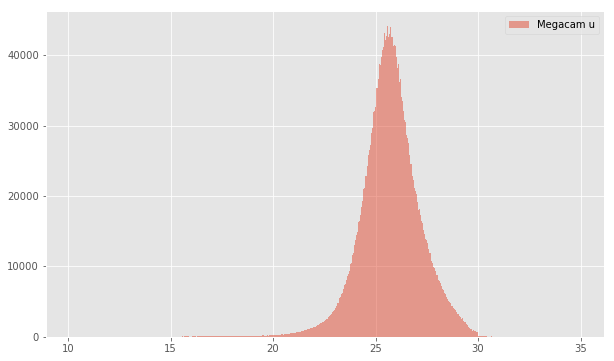

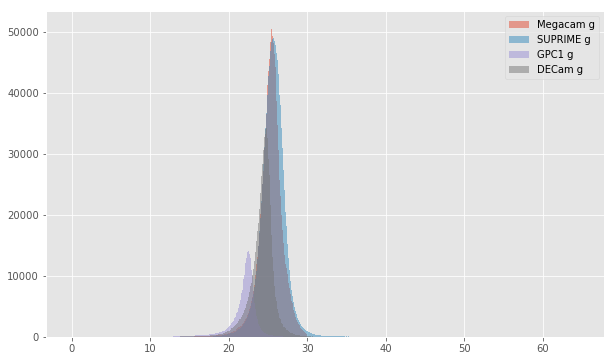

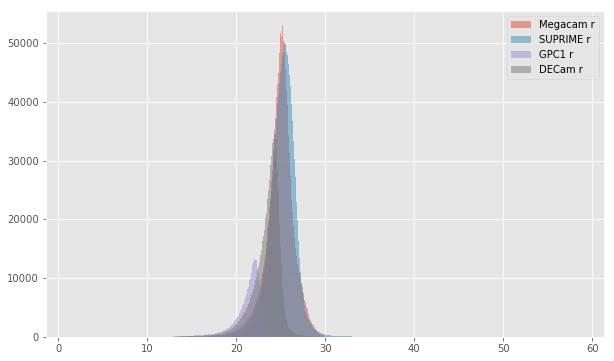

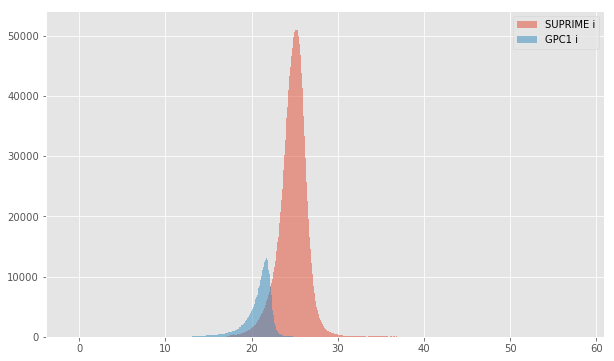

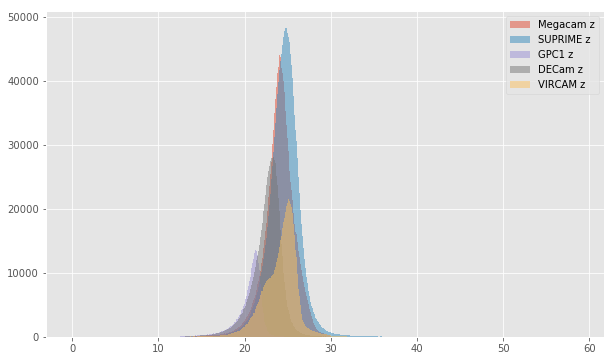

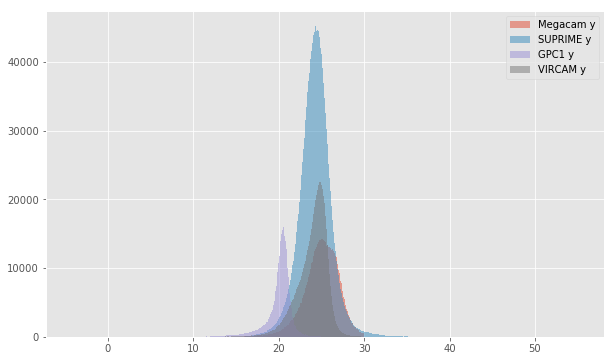

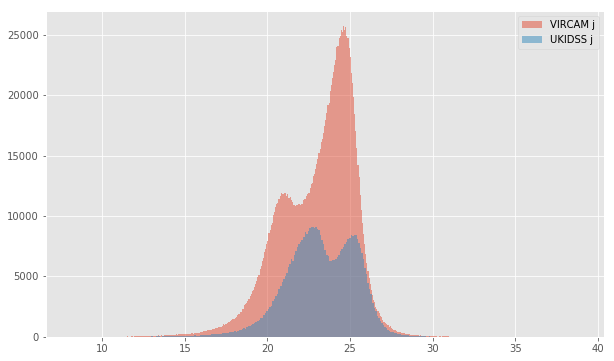

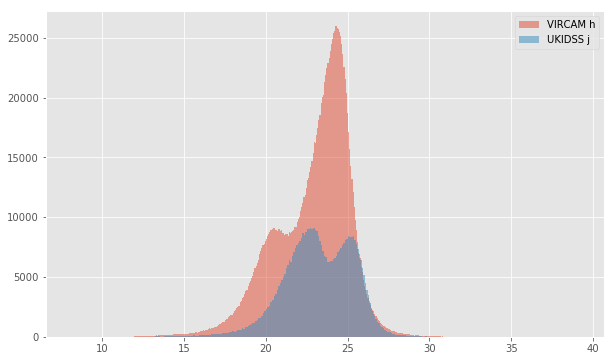

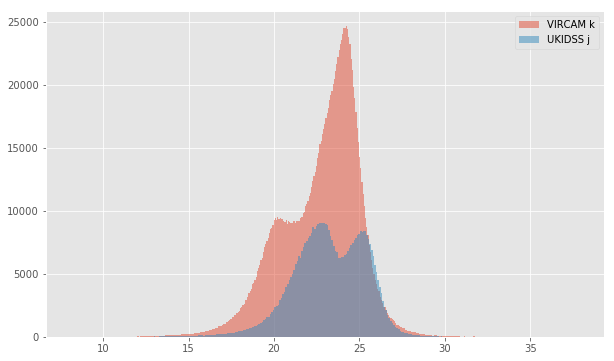

In [9]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

SUPRIME g (aperture) - Megacam g (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4483098983764648
- 99% percentile: 1.9926118850708008


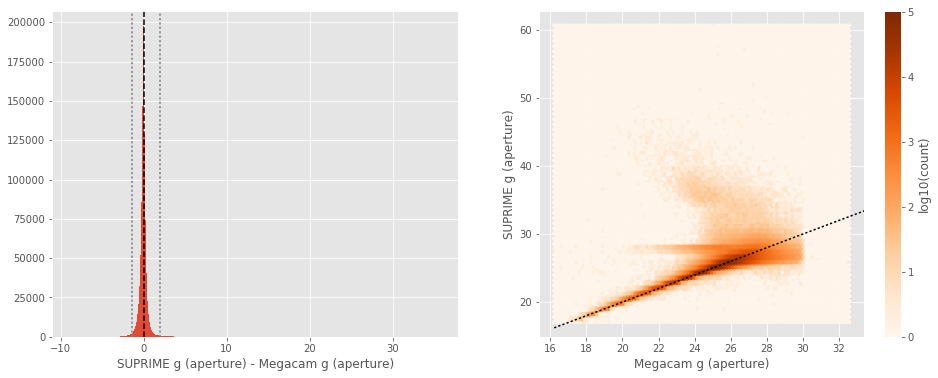

SUPRIME g (total) - Megacam g (total):
- Median: -0.09
- Median Absolute Deviation: 0.24
- 1% percentile: -2.2796373748779297
- 99% percentile: 2.318053646087643


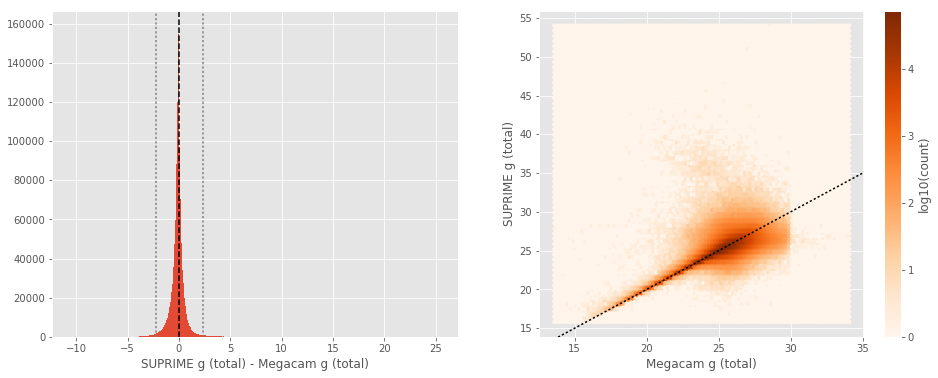

GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.26
- Median Absolute Deviation: 0.32
- 1% percentile: -2.922389602661133
- 99% percentile: 2.15511814117431


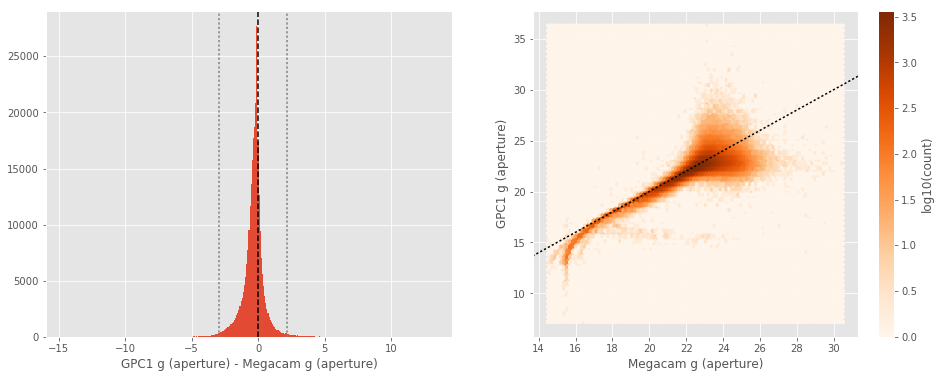

GPC1 g (total) - Megacam g (total):
- Median: 0.01
- Median Absolute Deviation: 0.26
- 1% percentile: -3.0582639503479006
- 99% percentile: 1.7543010711669922


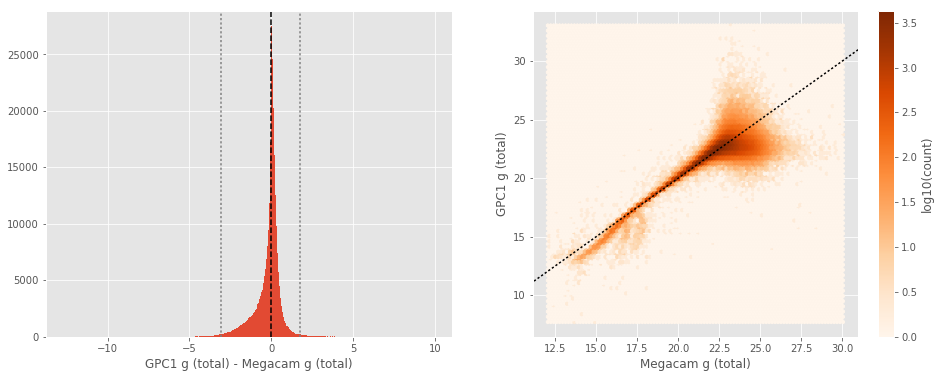

DECam g (aperture) - Megacam g (aperture):
- Median: -0.08
- Median Absolute Deviation: 0.21
- 1% percentile: -1.1811183166503905
- 99% percentile: 2.112486801147454


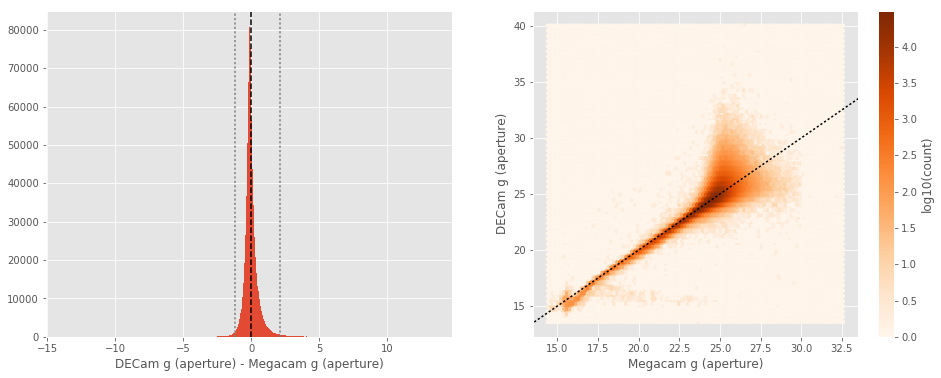

DECam g (total) - Megacam g (total):
- Median: 0.13
- Median Absolute Deviation: 0.18
- 1% percentile: -0.9527052307128906
- 99% percentile: 2.0308621215820217


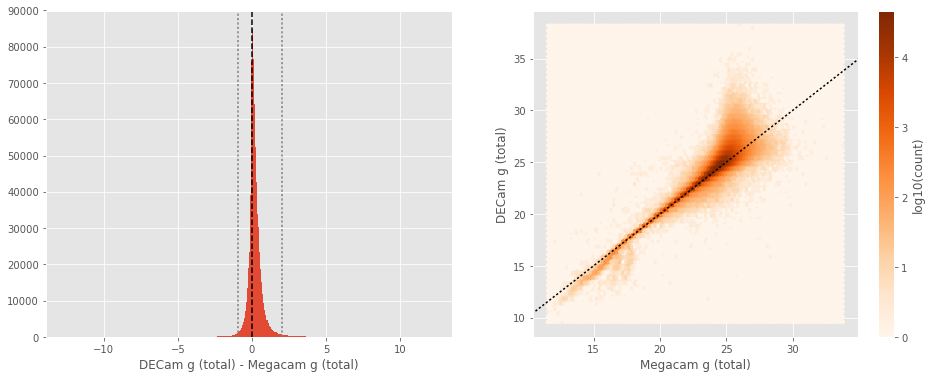

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.34
- Median Absolute Deviation: 0.40
- 1% percentile: -3.63887336730957
- 99% percentile: 2.140432815551756


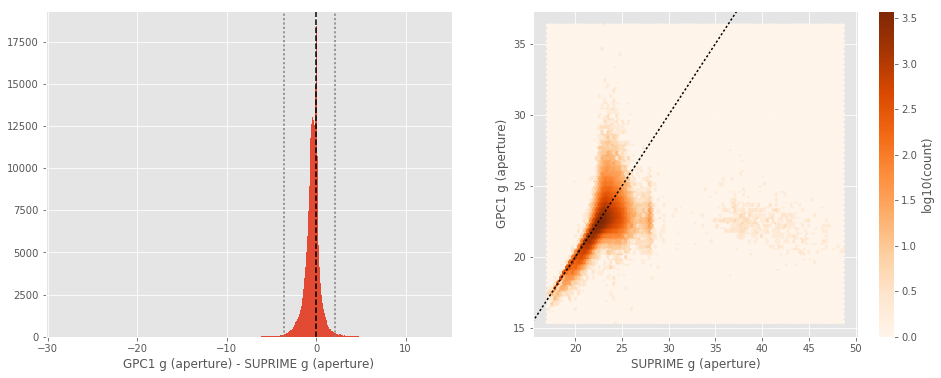

GPC1 g (total) - SUPRIME g (total):
- Median: 0.01
- Median Absolute Deviation: 0.28
- 1% percentile: -3.74440673828125
- 99% percentile: 1.7463184356689447


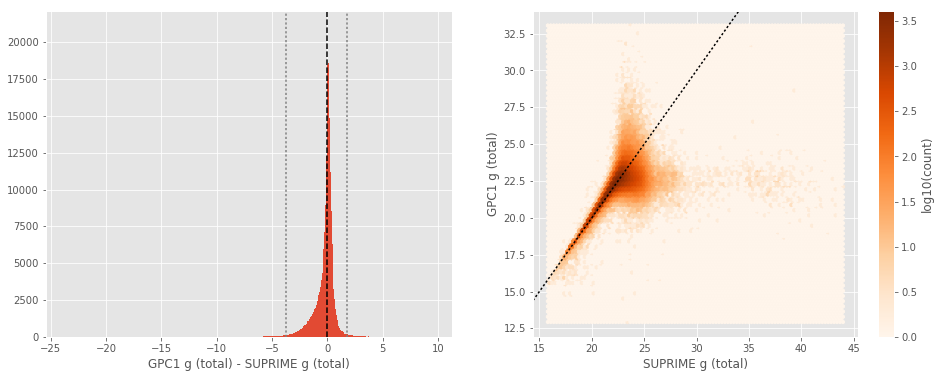

DECam g (aperture) - SUPRIME g (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.25
- 1% percentile: -2.4612117767333985
- 99% percentile: 2.183241653442389


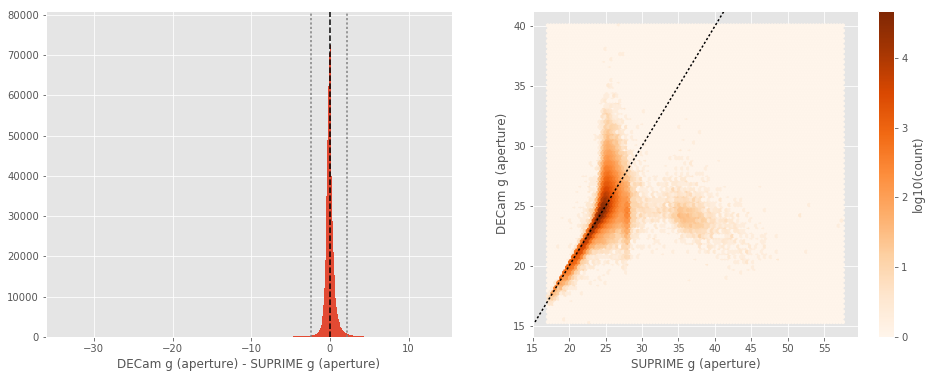

DECam g (total) - SUPRIME g (total):
- Median: 0.21
- Median Absolute Deviation: 0.21
- 1% percentile: -2.076807861328125
- 99% percentile: 2.233863716125488


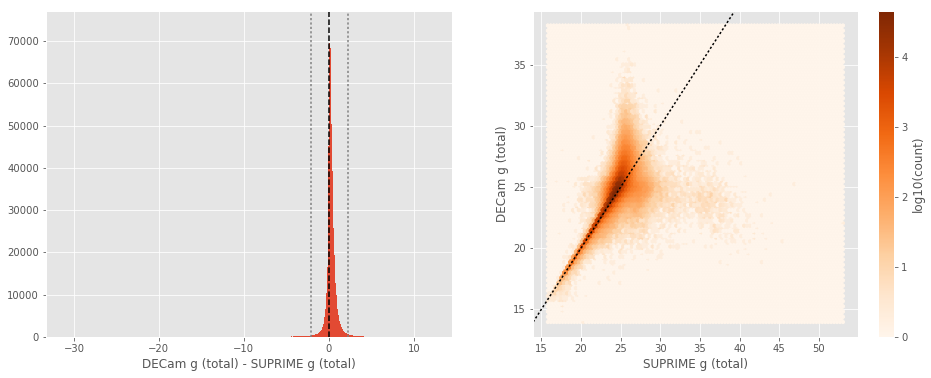

DECam g (aperture) - GPC1 g (aperture):
- Median: 0.10
- Median Absolute Deviation: 0.28
- 1% percentile: -2.302797317504883
- 99% percentile: 3.036126937866211


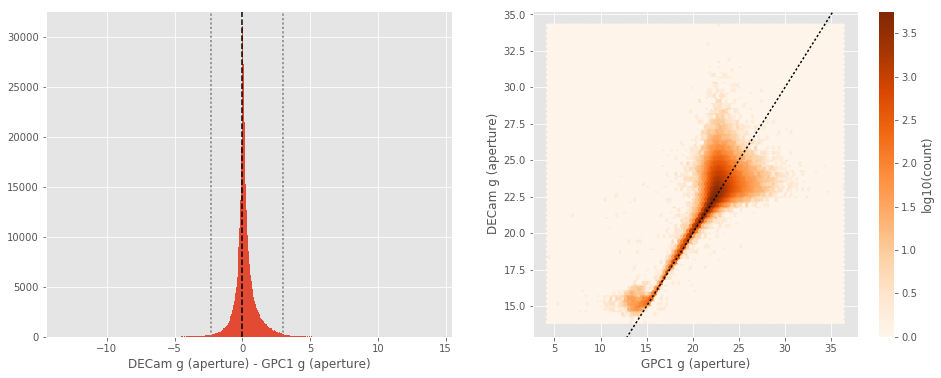

DECam g (total) - GPC1 g (total):
- Median: -0.01
- Median Absolute Deviation: 0.26
- 1% percentile: -1.7767018127441405
- 99% percentile: 3.415311203002934


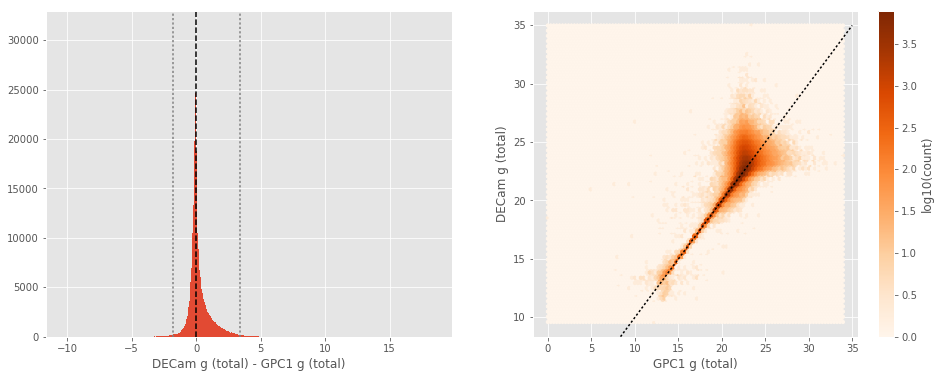

SUPRIME r (aperture) - Megacam r (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.19
- 1% percentile: -1.7427062225341796
- 99% percentile: 1.9742098236084091


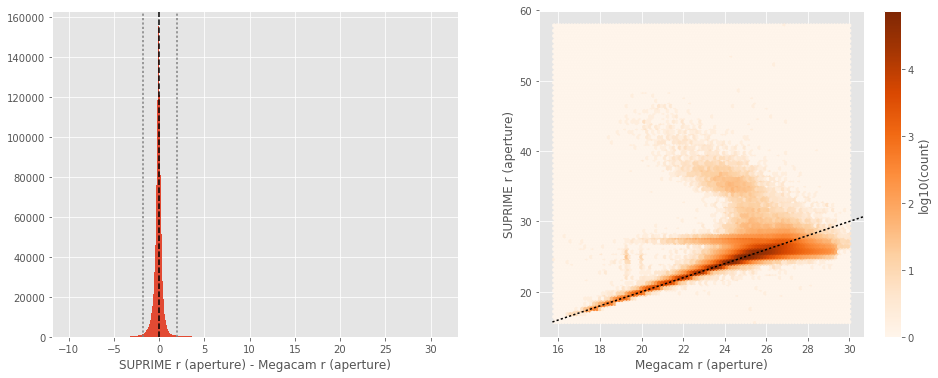

SUPRIME r (total) - Megacam r (total):
- Median: -0.11
- Median Absolute Deviation: 0.25
- 1% percentile: -2.4677522277832034
- 99% percentile: 2.405049591064458


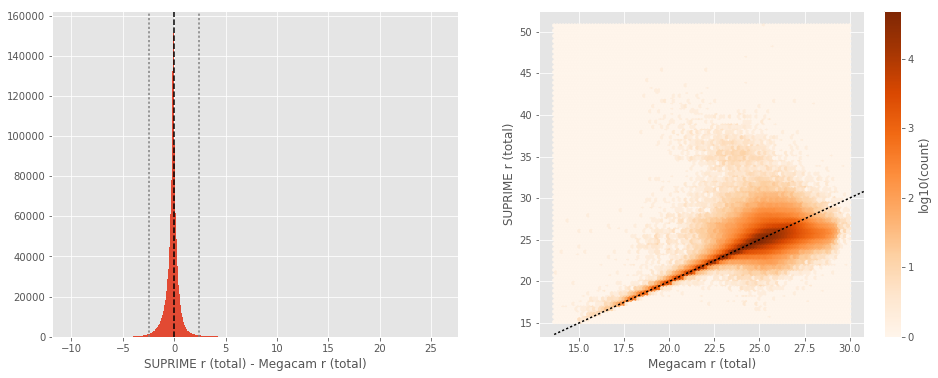

GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.20
- 1% percentile: -1.6823997497558594
- 99% percentile: 1.5248133659362808


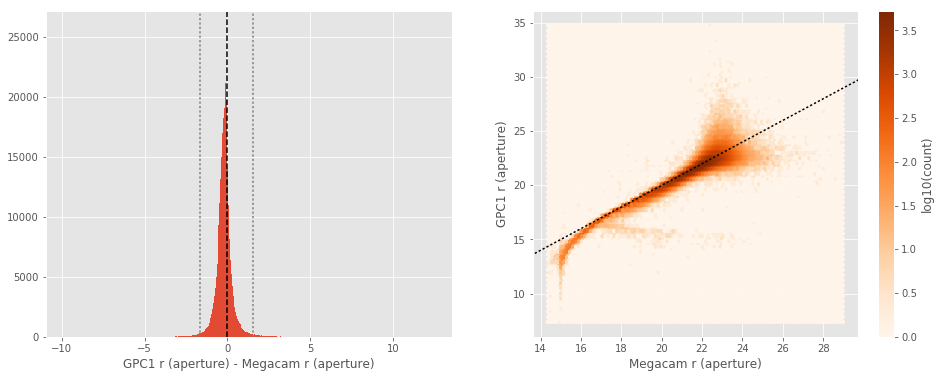

GPC1 r (total) - Megacam r (total):
- Median: 0.06
- Median Absolute Deviation: 0.14
- 1% percentile: -1.696656036376953
- 99% percentile: 1.1219566345214784


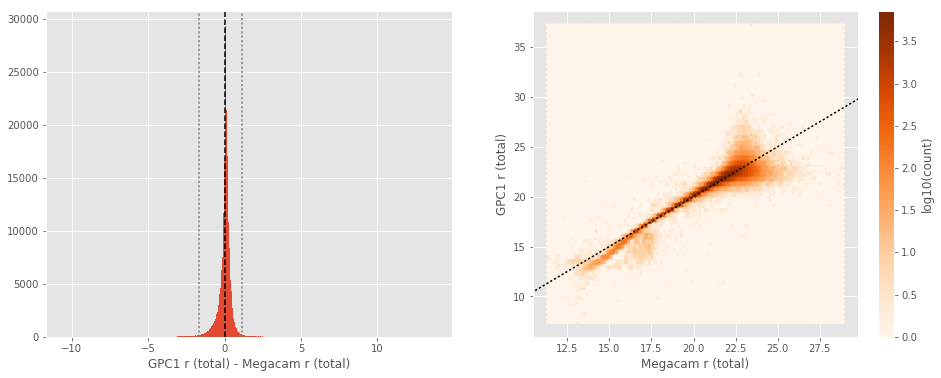

DECam r (aperture) - Megacam r (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.23
- 1% percentile: -1.171355857849121
- 99% percentile: 2.210715560913087


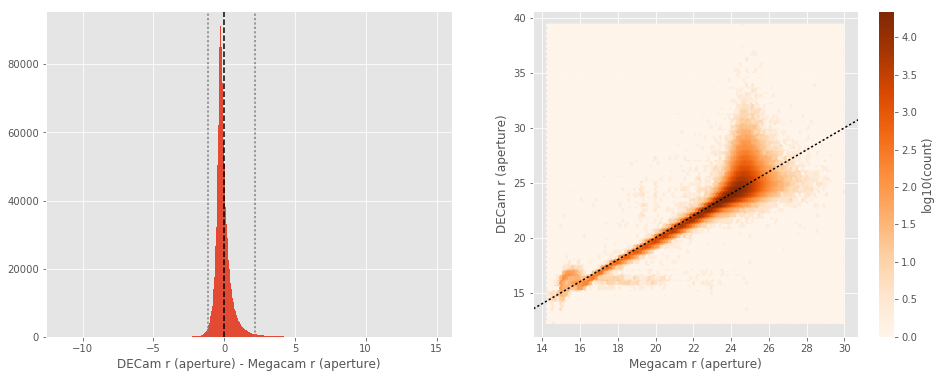

DECam r (total) - Megacam r (total):
- Median: -0.07
- Median Absolute Deviation: 0.18
- 1% percentile: -1.224824752807617
- 99% percentile: 1.1843146514892569


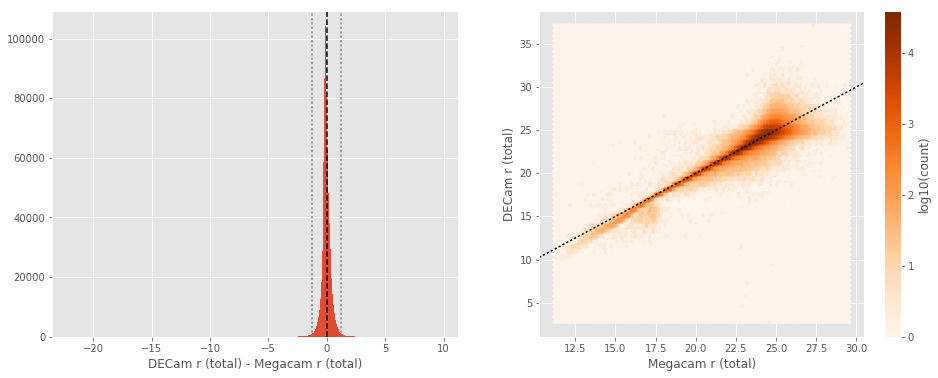

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.27
- 1% percentile: -2.692432670593262
- 99% percentile: 1.5765325546264626


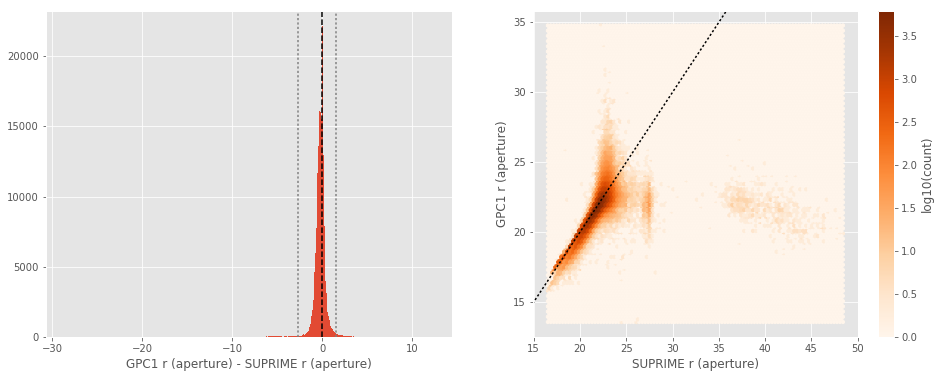

GPC1 r (total) - SUPRIME r (total):
- Median: 0.12
- Median Absolute Deviation: 0.16
- 1% percentile: -2.7956747817993164
- 99% percentile: 1.1564066696166995


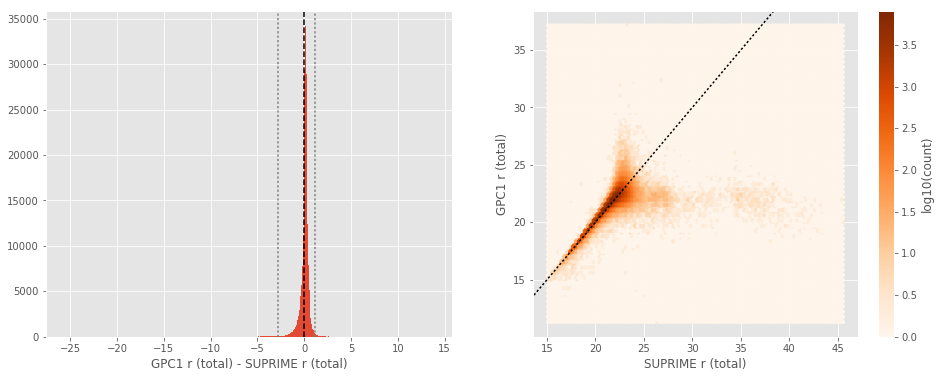

DECam r (aperture) - SUPRIME r (aperture):
- Median: -0.10
- Median Absolute Deviation: 0.27
- 1% percentile: -2.514927597045898
- 99% percentile: 2.380972080230713


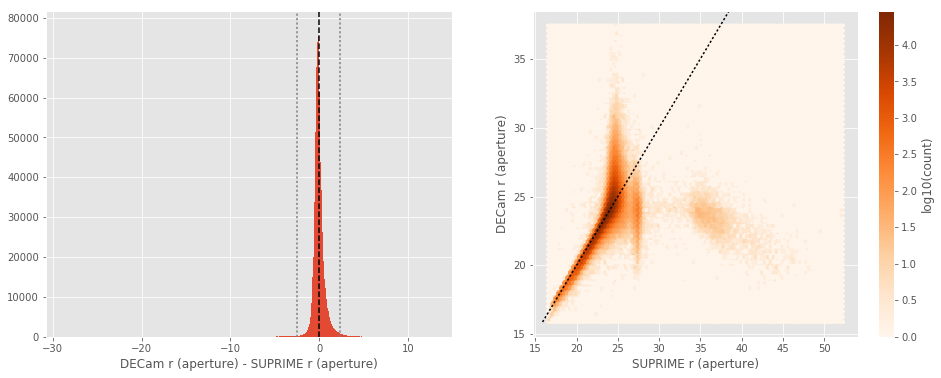

DECam r (total) - SUPRIME r (total):
- Median: 0.03
- Median Absolute Deviation: 0.20
- 1% percentile: -2.541008338928223
- 99% percentile: 1.5030912780761714


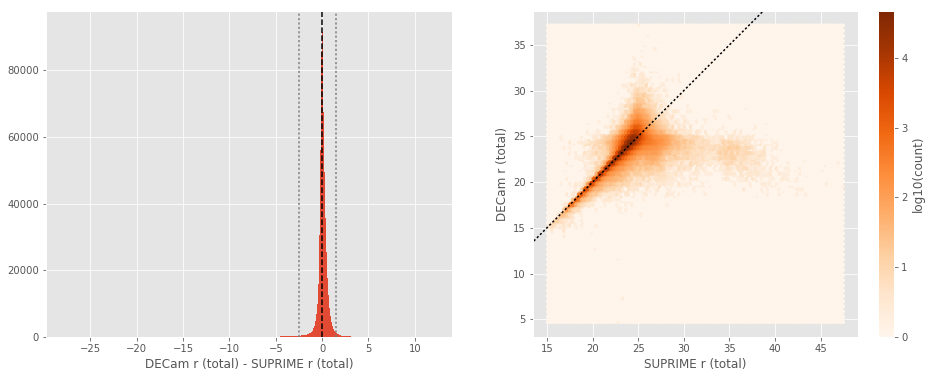

DECam r (aperture) - GPC1 r (aperture):
- Median: -0.08
- Median Absolute Deviation: 0.18
- 1% percentile: -1.7710686492919923
- 99% percentile: 1.831312179565407


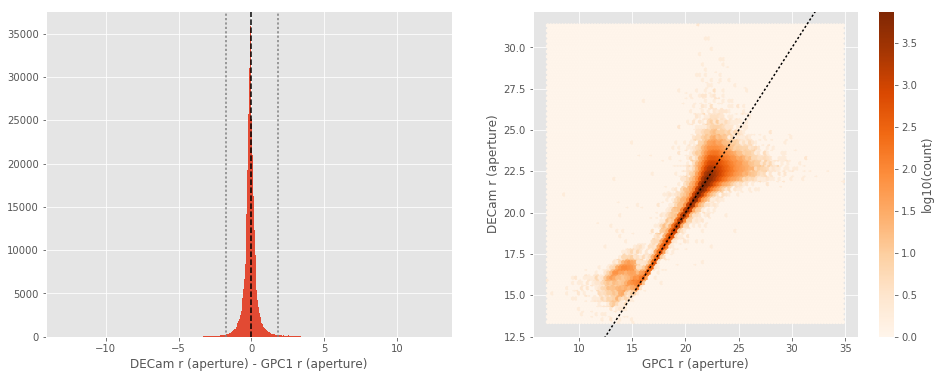

DECam r (total) - GPC1 r (total):
- Median: -0.22
- Median Absolute Deviation: 0.15
- 1% percentile: -1.5473146820068355
- 99% percentile: 1.3859005737304706


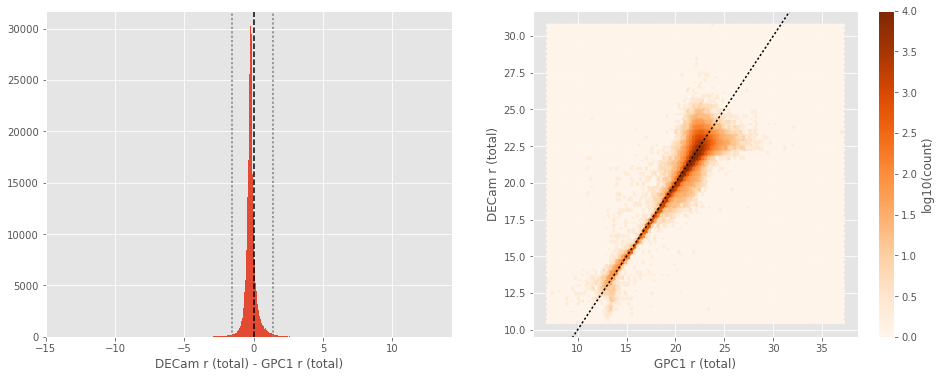

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -4.781778450012207
- 99% percentile: 0.6964595603942864


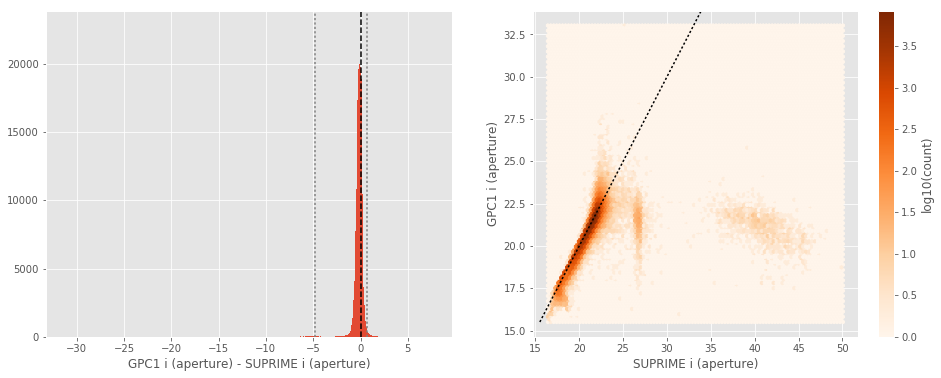

GPC1 i (total) - SUPRIME i (total):
- Median: 0.19
- Median Absolute Deviation: 0.11
- 1% percentile: -4.400829467773438
- 99% percentile: 0.7501198959350581


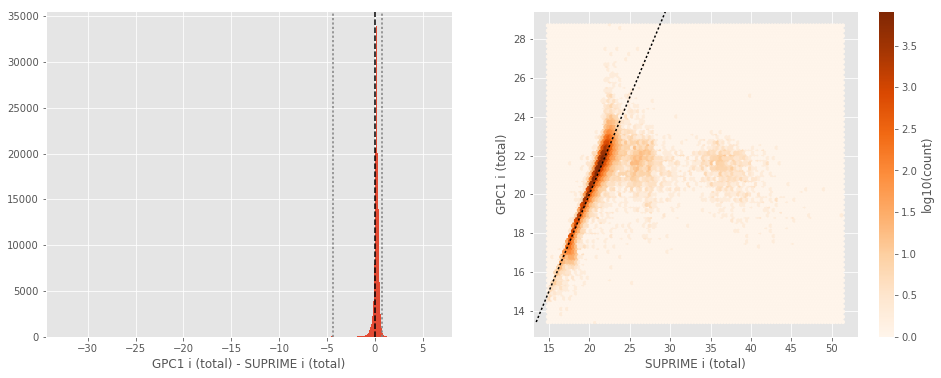

SUPRIME z (aperture) - Megacam z (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.32
- 1% percentile: -2.448016357421875
- 99% percentile: 3.2967525482177784


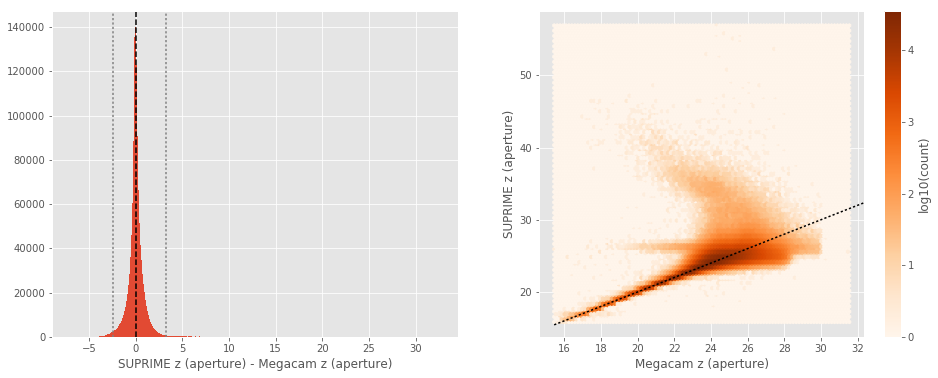

SUPRIME z (total) - Megacam z (total):
- Median: -0.07
- Median Absolute Deviation: 0.42
- 1% percentile: -2.9330552291870116
- 99% percentile: 3.2738224792480537


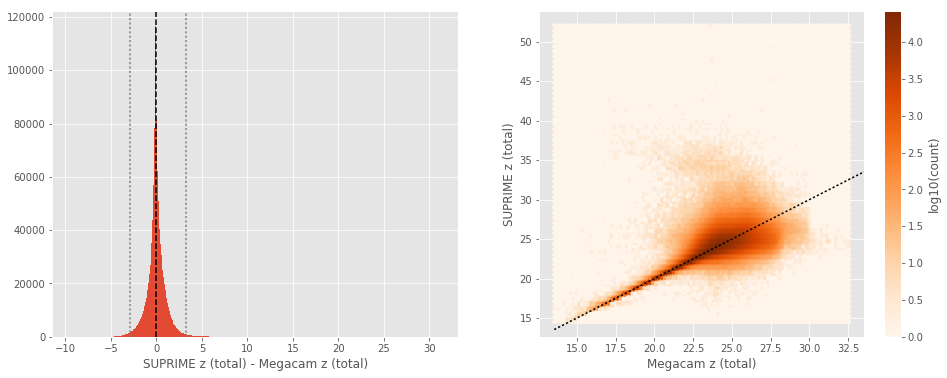

GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.14
- 1% percentile: -1.2277031707763673
- 99% percentile: 0.9080109024047944


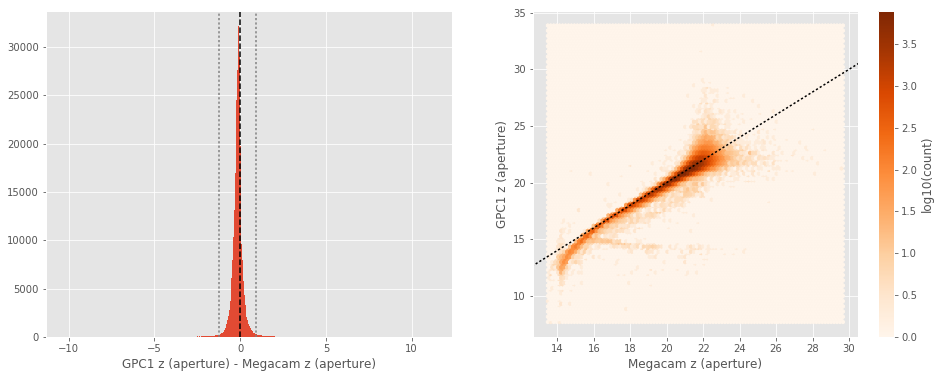

GPC1 z (total) - Megacam z (total):
- Median: 0.10
- Median Absolute Deviation: 0.12
- 1% percentile: -1.0412810516357422
- 99% percentile: 0.8804988861083984


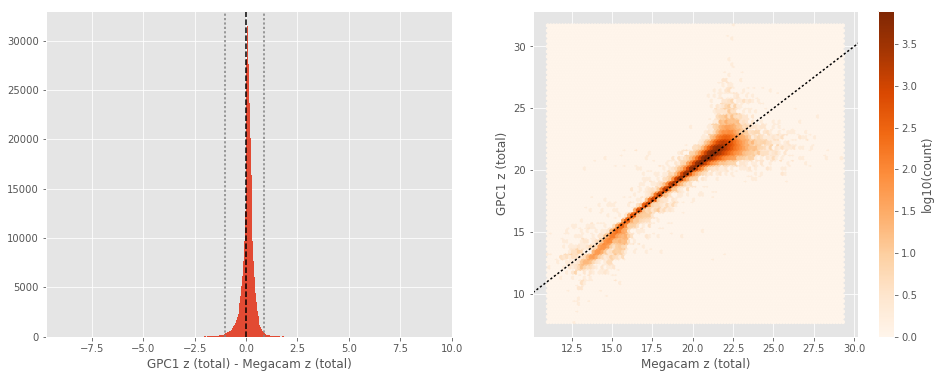

DECam z (aperture) - Megacam z (aperture):
- Median: -0.25
- Median Absolute Deviation: 0.29
- 1% percentile: -2.4187049865722656
- 99% percentile: 2.695146560668933


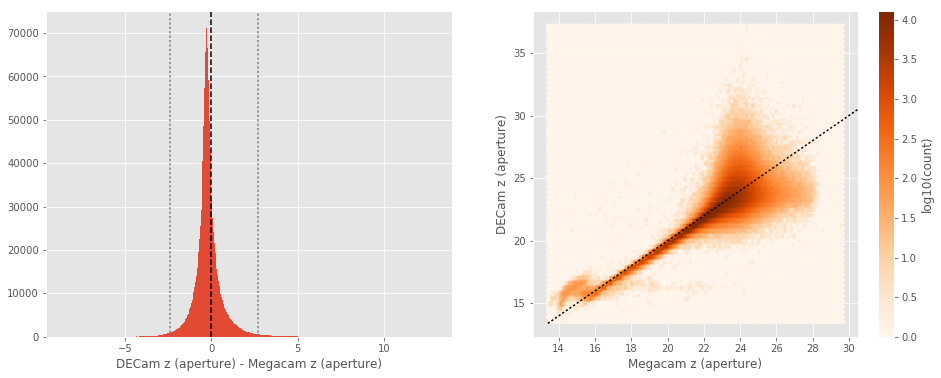

DECam z (total) - Megacam z (total):
- Median: -0.12
- Median Absolute Deviation: 0.26
- 1% percentile: -2.4386180877685546
- 99% percentile: 2.0305015563964846


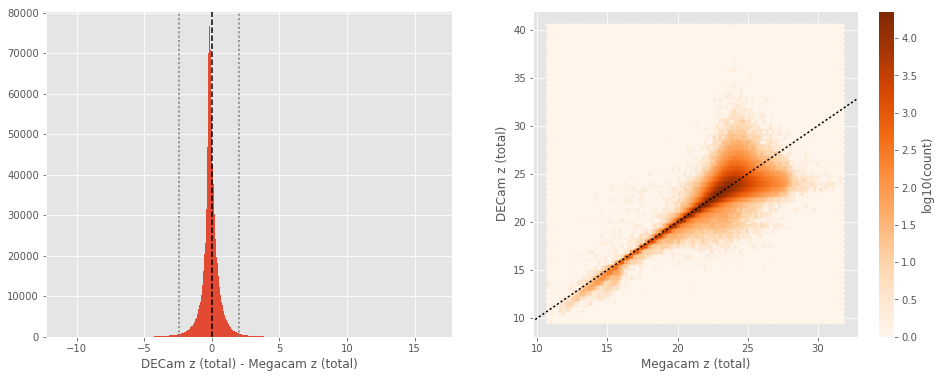

VIRCAM z (aperture) - Megacam z (aperture):
- Median: 0.04
- Median Absolute Deviation: 0.23
- 1% percentile: -2.3195960617065428
- 99% percentile: 5.068790473937982


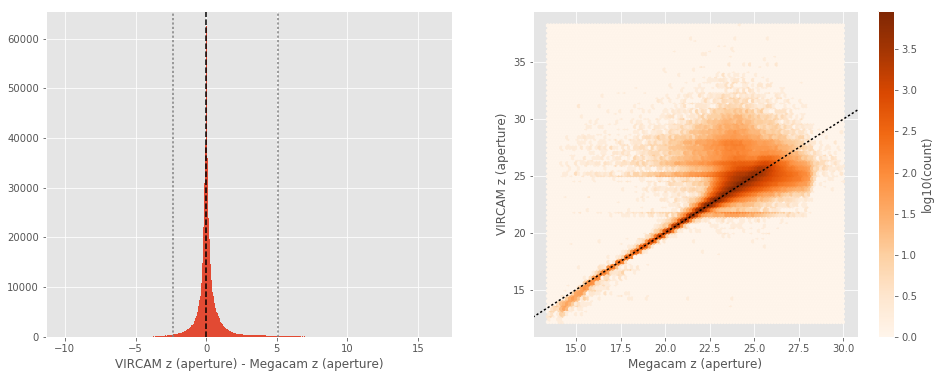

VIRCAM z (total) - Megacam z (total):
- Median: 0.10
- Median Absolute Deviation: 0.33
- 1% percentile: -2.2589456176757814
- 99% percentile: 5.133895874023441


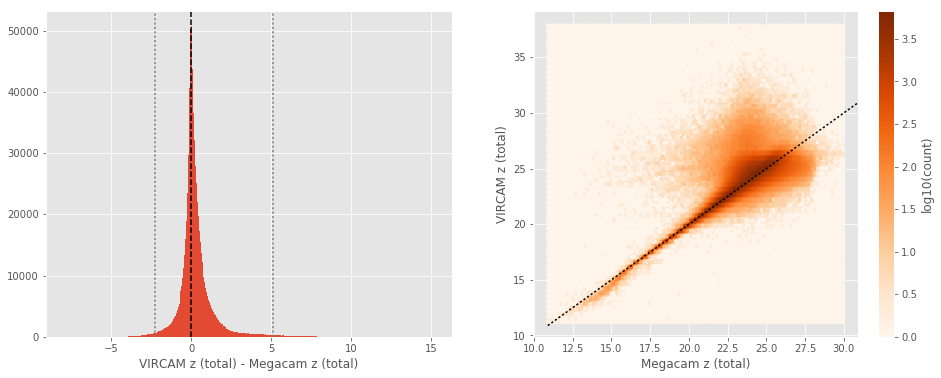

GPC1 z (aperture) - SUPRIME z (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.20
- 1% percentile: -2.555379219055175
- 99% percentile: 0.9683575057983382


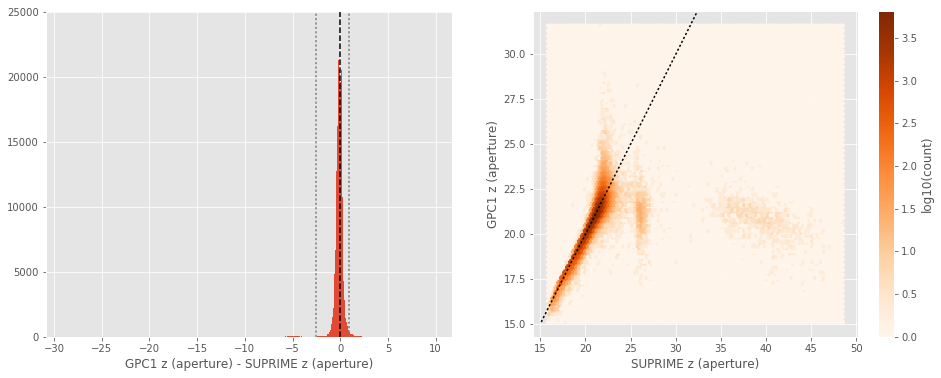

GPC1 z (total) - SUPRIME z (total):
- Median: 0.19
- Median Absolute Deviation: 0.13
- 1% percentile: -2.387874717712403
- 99% percentile: 0.9101642227172849


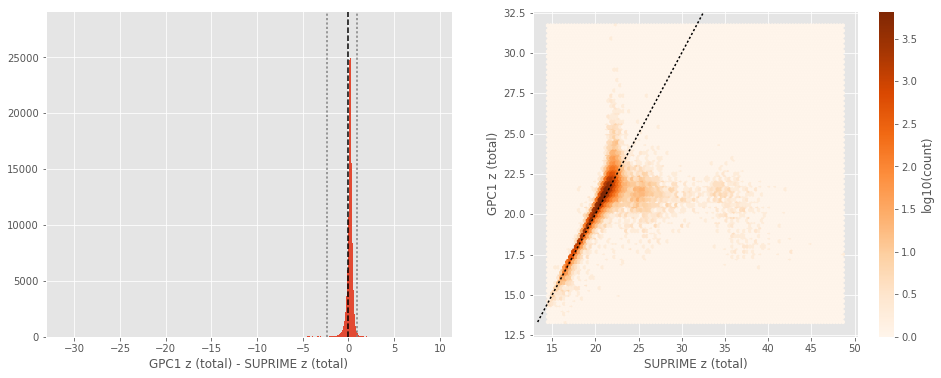

DECam z (aperture) - SUPRIME z (aperture):
- Median: -0.18
- Median Absolute Deviation: 0.31
- 1% percentile: -3.265641212463379
- 99% percentile: 2.778275489807129


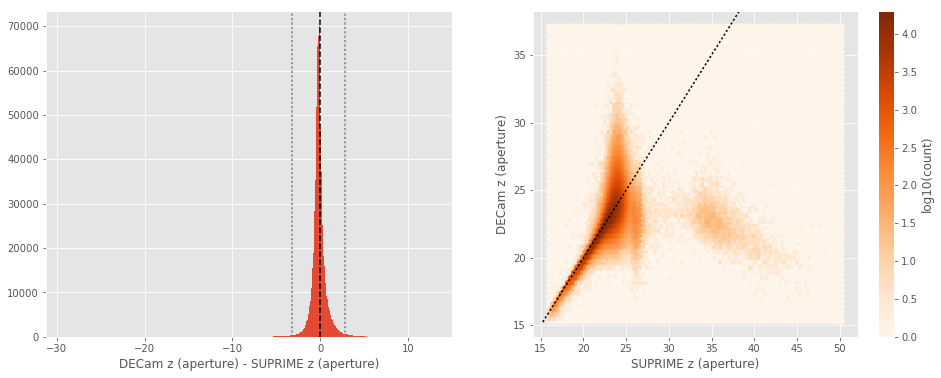

DECam z (total) - SUPRIME z (total):
- Median: 0.00
- Median Absolute Deviation: 0.21
- 1% percentile: -2.932722759246826
- 99% percentile: 2.109028720855707


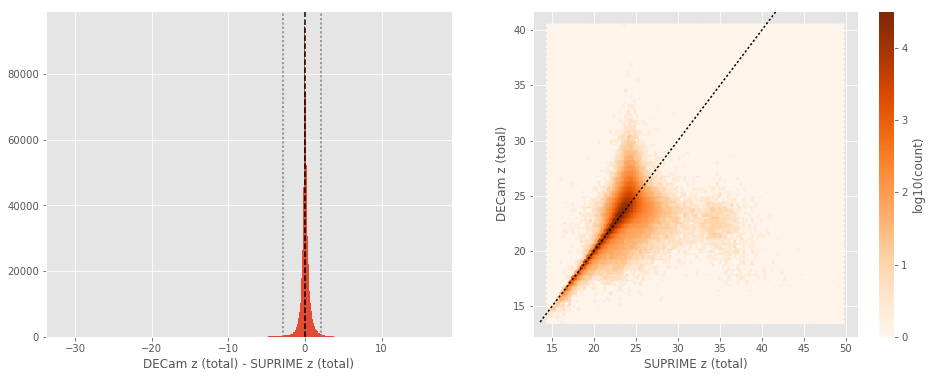

VIRCAM z (aperture) - SUPRIME z (aperture):
- Median: 0.06
- Median Absolute Deviation: 0.18
- 1% percentile: -2.593037872314453
- 99% percentile: 4.799118499755852


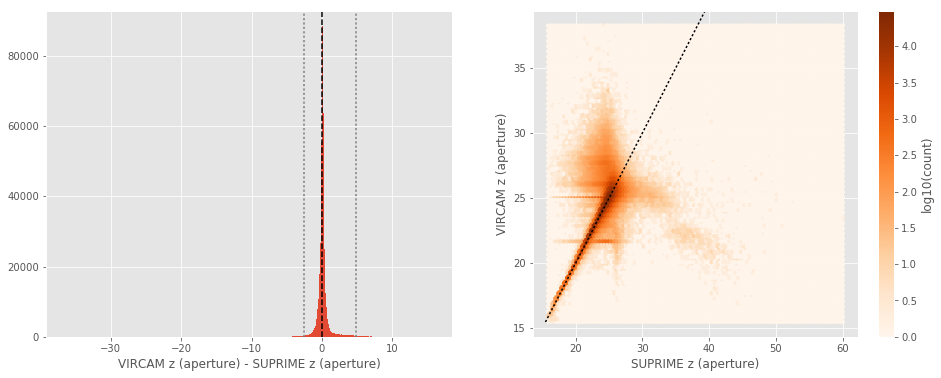

VIRCAM z (total) - SUPRIME z (total):
- Median: 0.15
- Median Absolute Deviation: 0.29
- 1% percentile: -2.66920768737793
- 99% percentile: 5.024603118896463


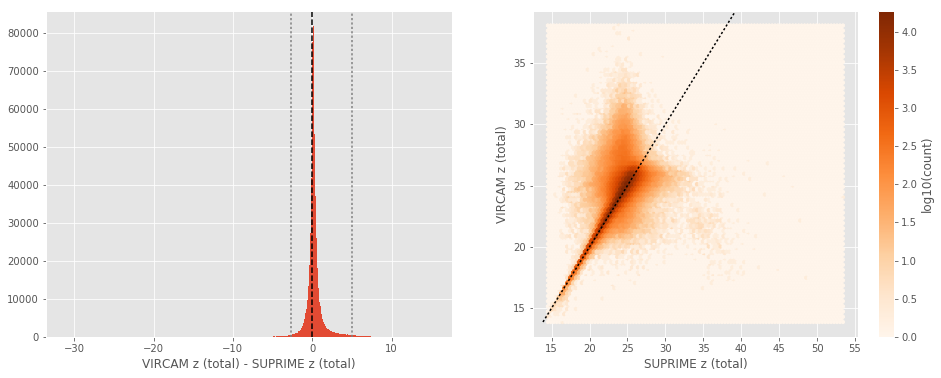

DECam z (aperture) - GPC1 z (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2277854347229005
- 99% percentile: 2.150250682830812


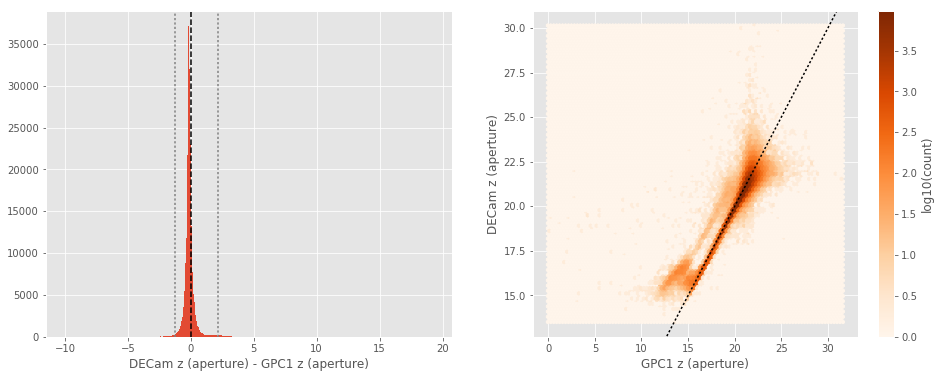

DECam z (total) - GPC1 z (total):
- Median: -0.27
- Median Absolute Deviation: 0.13
- 1% percentile: -1.3960829544067384
- 99% percentile: 0.8739760780334483


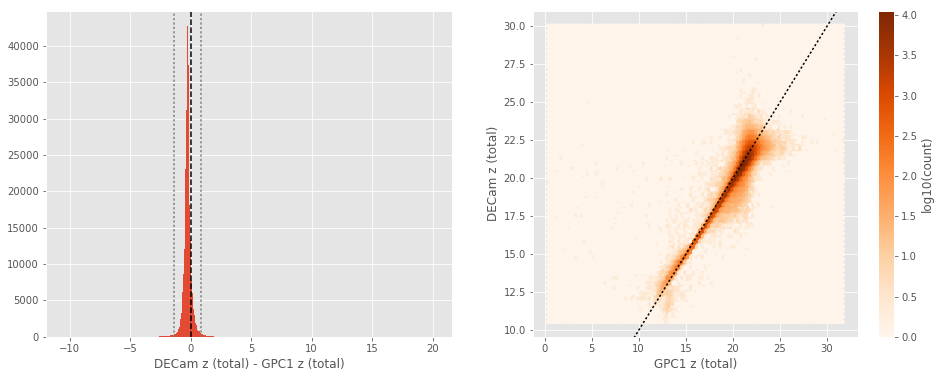

VIRCAM z (aperture) - GPC1 z (aperture):
- Median: 0.14
- Median Absolute Deviation: 0.16
- 1% percentile: -0.8961103057861328
- 99% percentile: 7.704749069213866


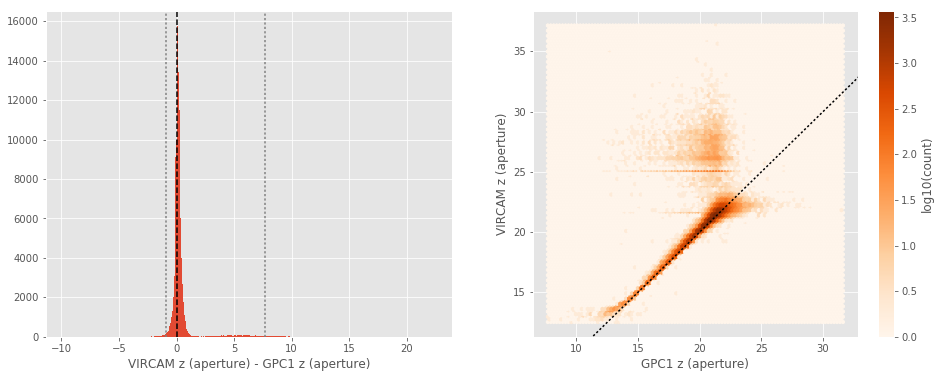

VIRCAM z (total) - GPC1 z (total):
- Median: -0.13
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9847936248779297
- 99% percentile: 6.875855712890623


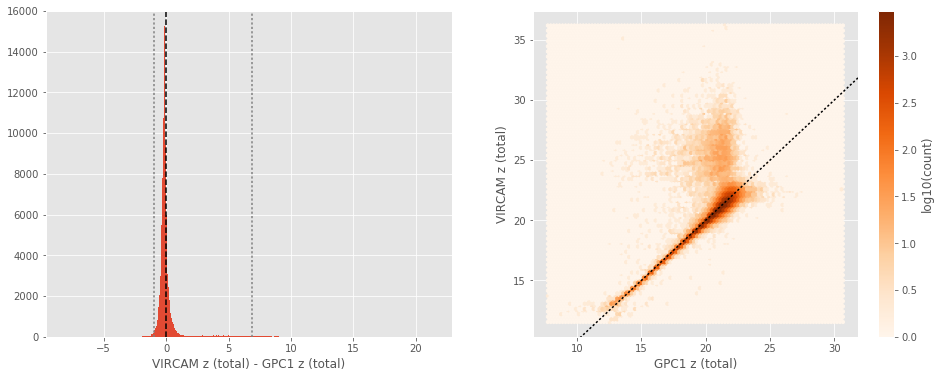

VIRCAM z (aperture) - DECam z (aperture):
- Median: 0.22
- Median Absolute Deviation: 0.24
- 1% percentile: -2.514739685058594
- 99% percentile: 6.131947021484377


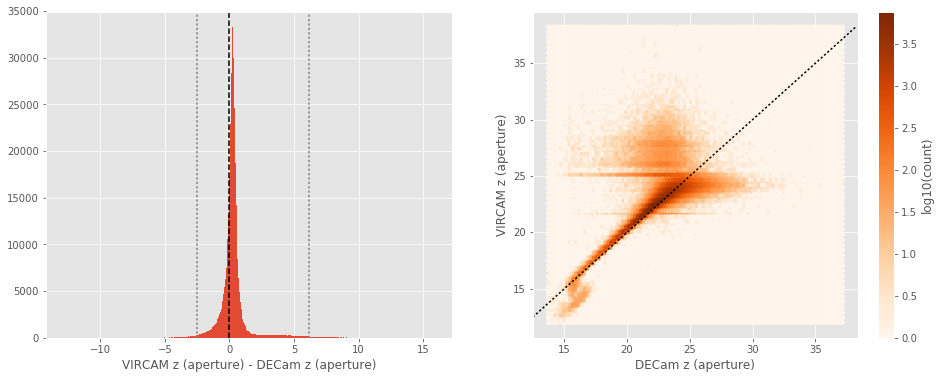

VIRCAM z (total) - DECam z (total):
- Median: 0.12
- Median Absolute Deviation: 0.21
- 1% percentile: -1.5759179687500002
- 99% percentile: 5.729764804840084


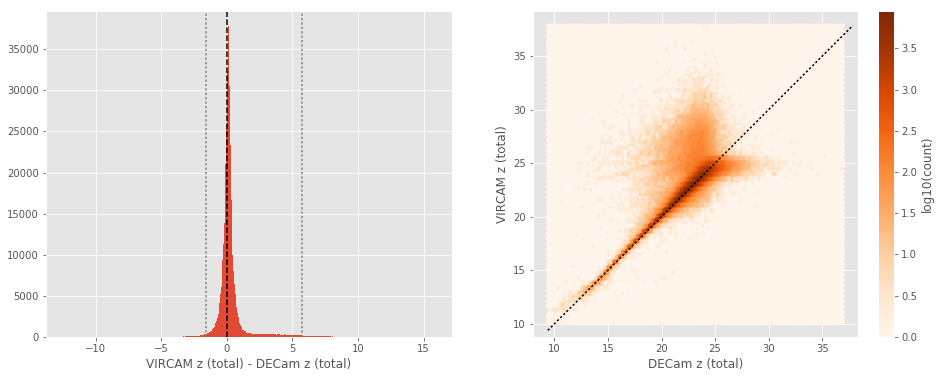

SUPRIME y (aperture) - Megacam y (aperture):
- Median: -0.44
- Median Absolute Deviation: 0.38
- 1% percentile: -2.362299919128418
- 99% percentile: 4.703008651733398


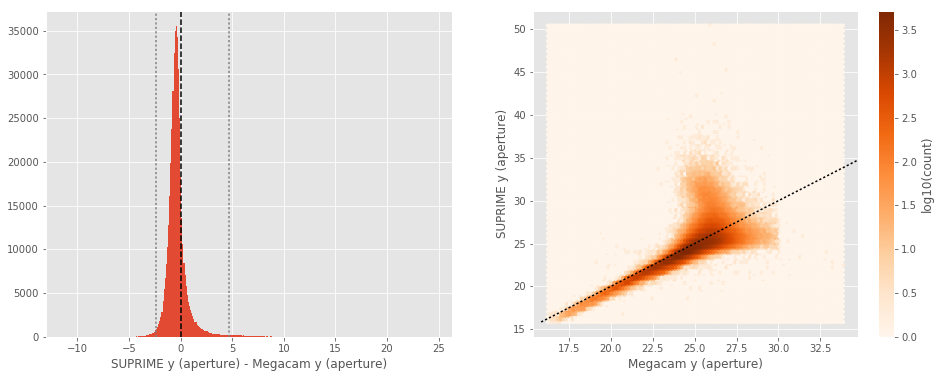

SUPRIME y (total) - Megacam y (total):
- Median: -0.55
- Median Absolute Deviation: 0.50
- 1% percentile: -3.7402098846435545
- 99% percentile: 3.2572619628906354


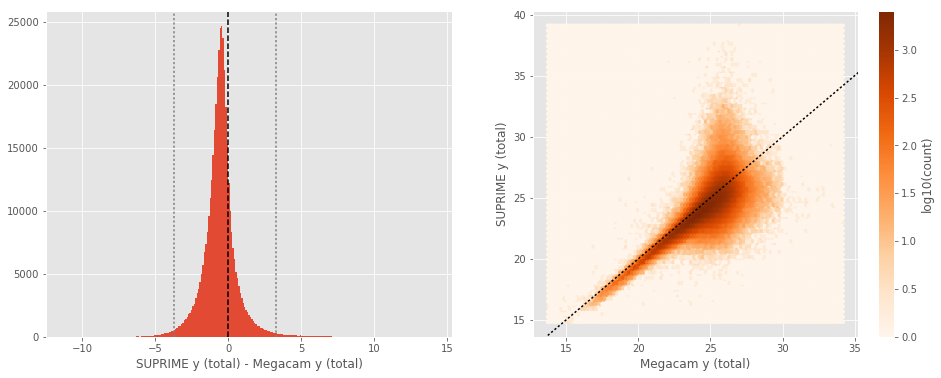

GPC1 y (aperture) - Megacam y (aperture):
- Median: -0.85
- Median Absolute Deviation: 0.33
- 1% percentile: -3.6013498878479004
- 99% percentile: 1.2522003364562988


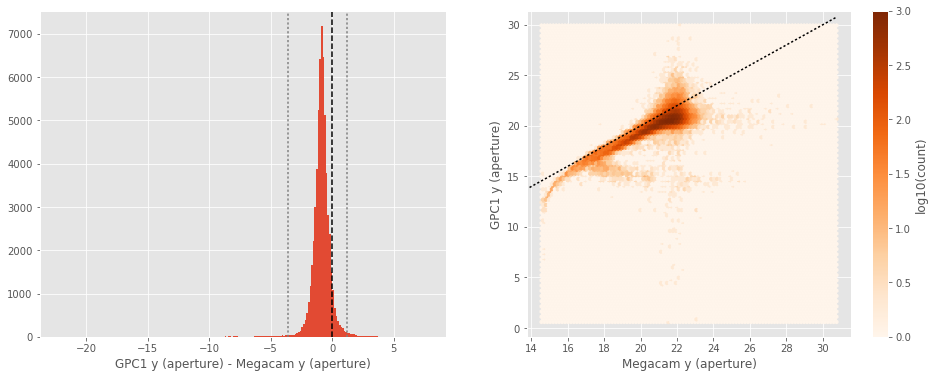

GPC1 y (total) - Megacam y (total):
- Median: -0.49
- Median Absolute Deviation: 0.39
- 1% percentile: -3.0049793243408205
- 99% percentile: 1.352081871032714


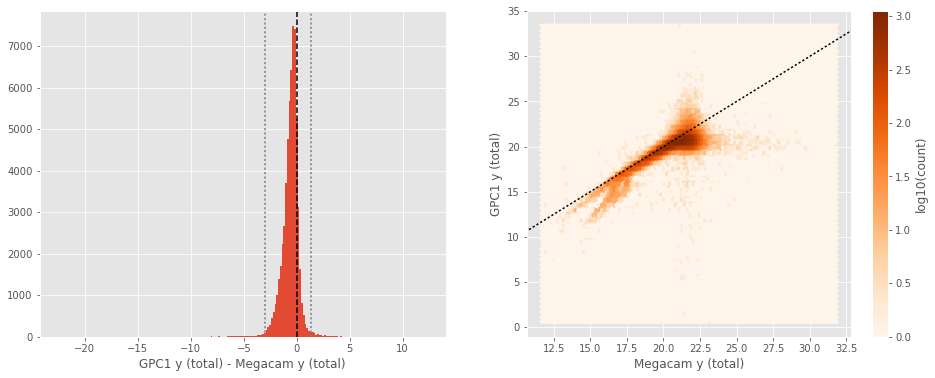

VIRCAM y (aperture) - Megacam y (aperture):
- Median: -0.39
- Median Absolute Deviation: 0.30
- 1% percentile: -1.896066665649414
- 99% percentile: 1.2390281677246078


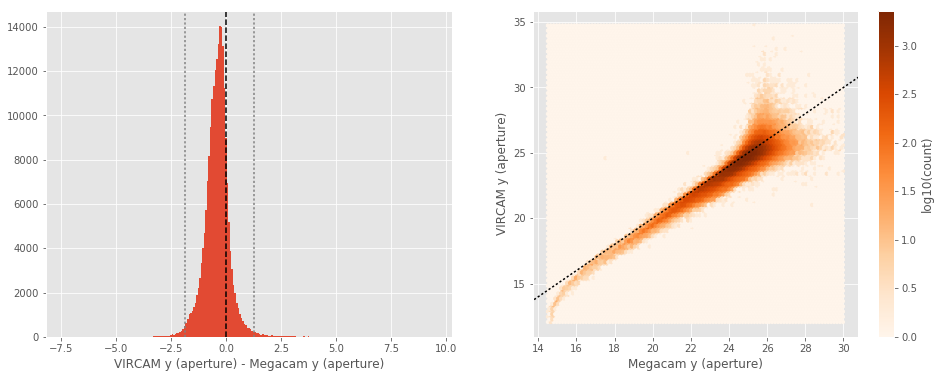

VIRCAM y (total) - Megacam y (total):
- Median: -0.29
- Median Absolute Deviation: 0.34
- 1% percentile: -1.9751595306396483
- 99% percentile: 1.1648015594482426


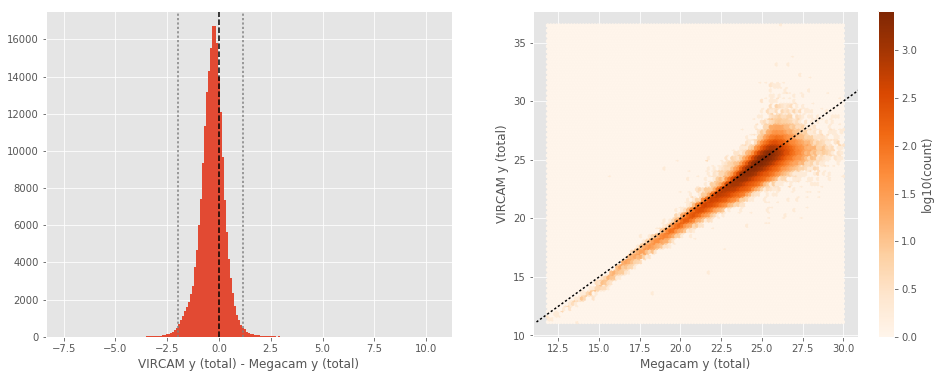

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.29
- Median Absolute Deviation: 0.32
- 1% percentile: -2.0788632011413575
- 99% percentile: 1.671594486236573


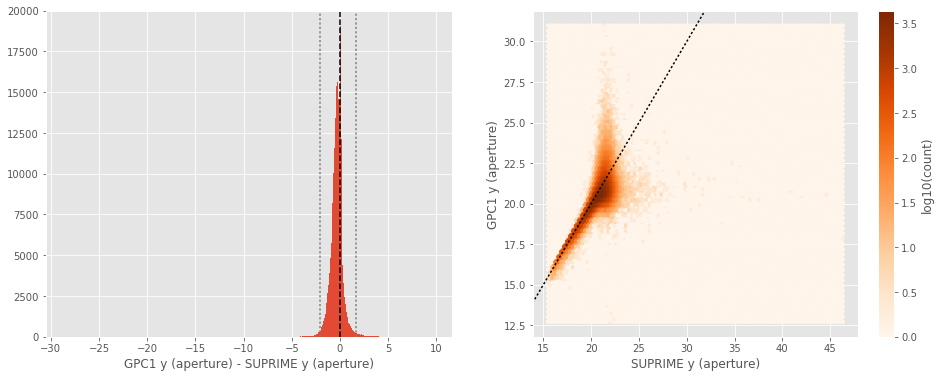

GPC1 y (total) - SUPRIME y (total):
- Median: 0.07
- Median Absolute Deviation: 0.29
- 1% percentile: -2.2870947265625
- 99% percentile: 1.6791526794433507


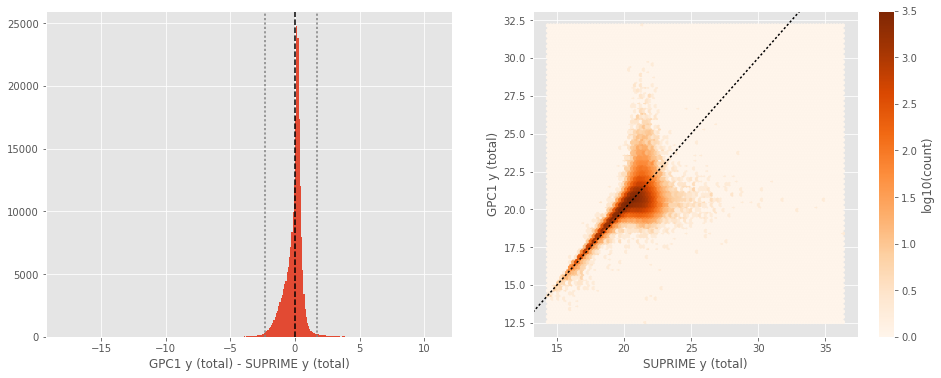

VIRCAM y (aperture) - SUPRIME y (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.23
- 1% percentile: -3.085487289428711
- 99% percentile: 1.6951151275634828


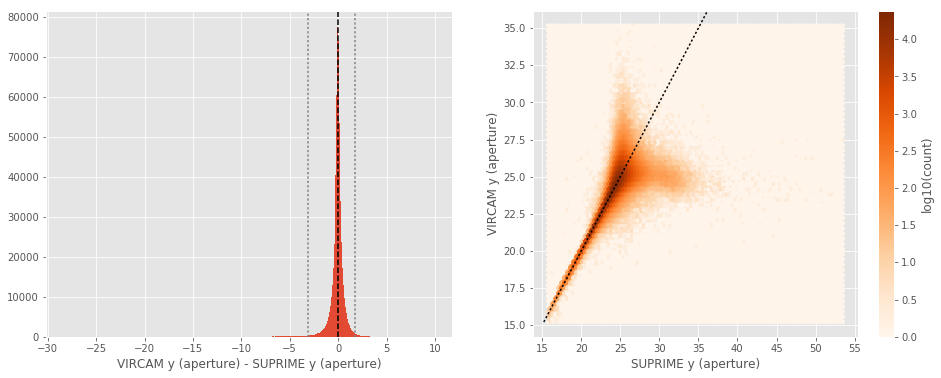

VIRCAM y (total) - SUPRIME y (total):
- Median: 0.10
- Median Absolute Deviation: 0.33
- 1% percentile: -2.8656583404541016
- 99% percentile: 2.7909027099609394


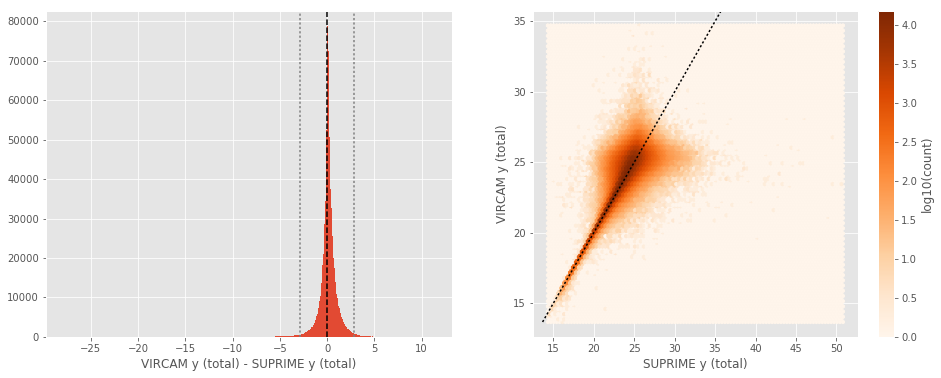

VIRCAM y (aperture) - GPC1 y (aperture):
- Median: 0.20
- Median Absolute Deviation: 0.25
- 1% percentile: -1.571140251159668
- 99% percentile: 1.9104980468749981


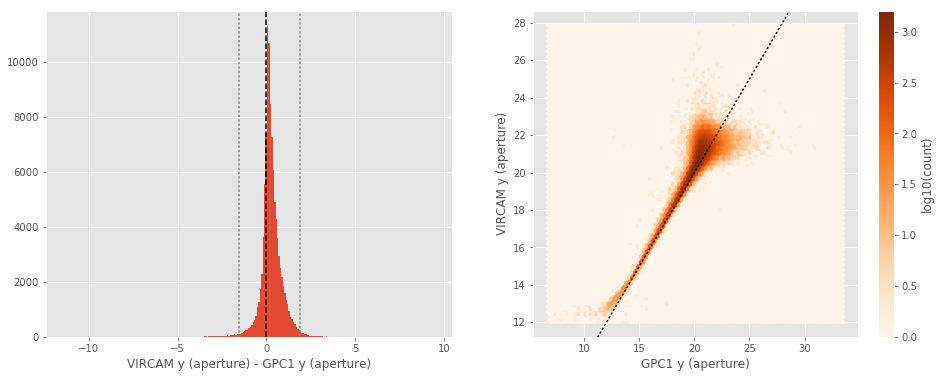

VIRCAM y (total) - GPC1 y (total):
- Median: -0.10
- Median Absolute Deviation: 0.27
- 1% percentile: -1.6898953437805178
- 99% percentile: 2.2788714408874515


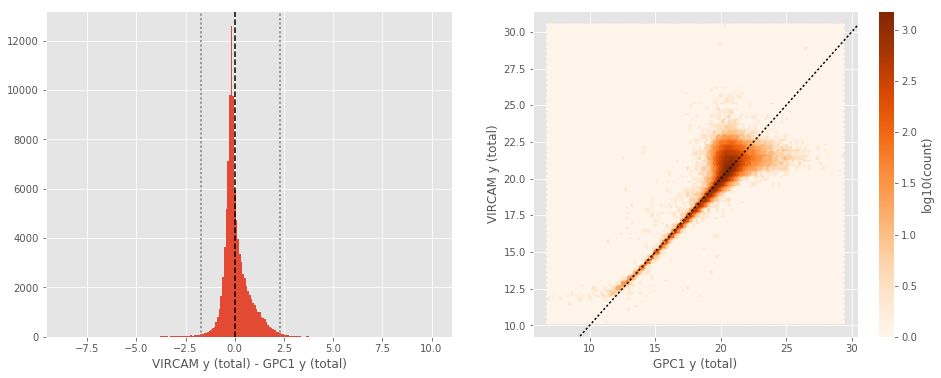

UKIDSS j (aperture) - VIRCAM j (aperture):
- Median: 0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -1.9186085510253905
- 99% percentile: 1.069121322631836


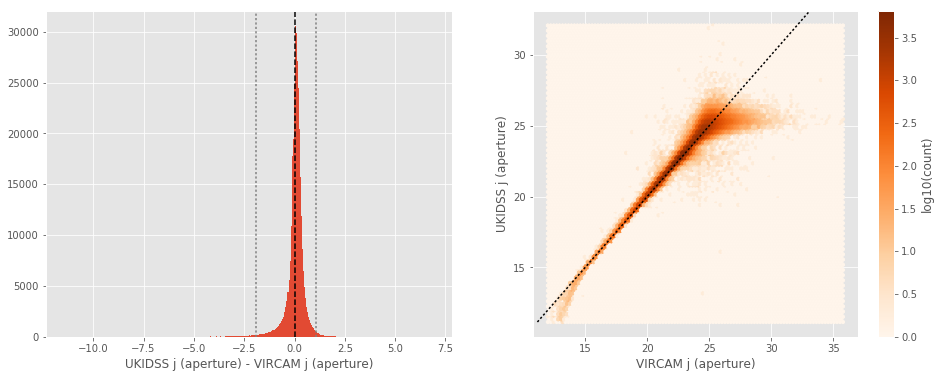

UKIDSS j (total) - VIRCAM j (total):
- Median: -0.04
- Median Absolute Deviation: 0.20
- 1% percentile: -1.9965031242370606
- 99% percentile: 1.1109847259521484


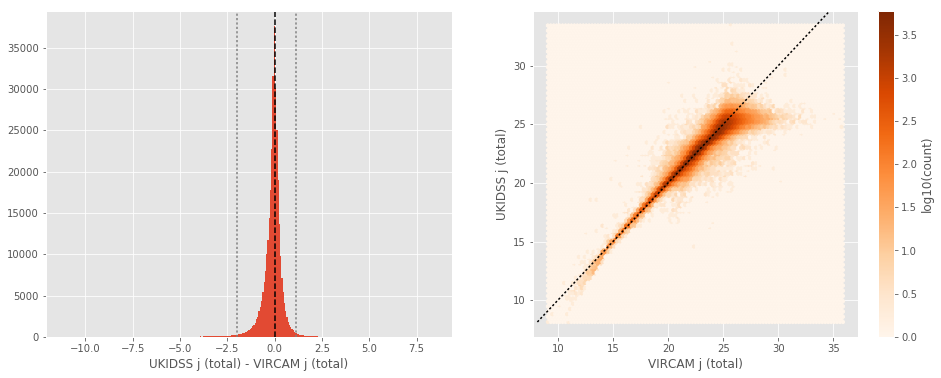

UKIDSS j (aperture) - VIRCAM h (aperture):
- Median: 0.34
- Median Absolute Deviation: 0.23
- 1% percentile: -1.862683277130127
- 99% percentile: 1.4852854537963847


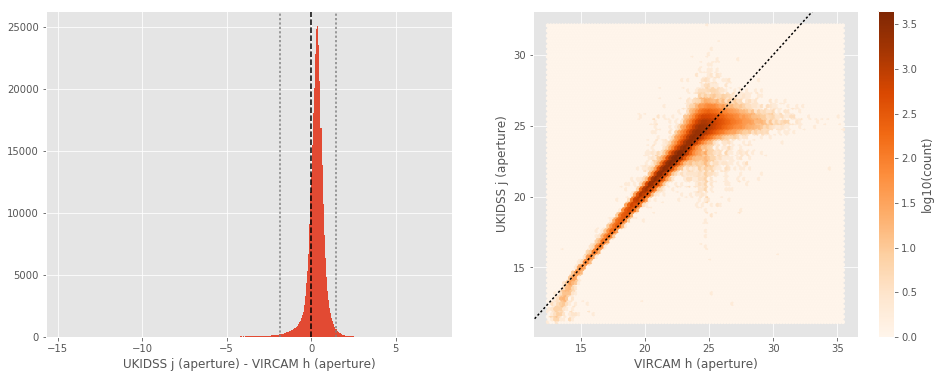

UKIDSS j (total) - VIRCAM h (total):
- Median: 0.20
- Median Absolute Deviation: 0.26
- 1% percentile: -1.939602279663086
- 99% percentile: 1.4660823822021585


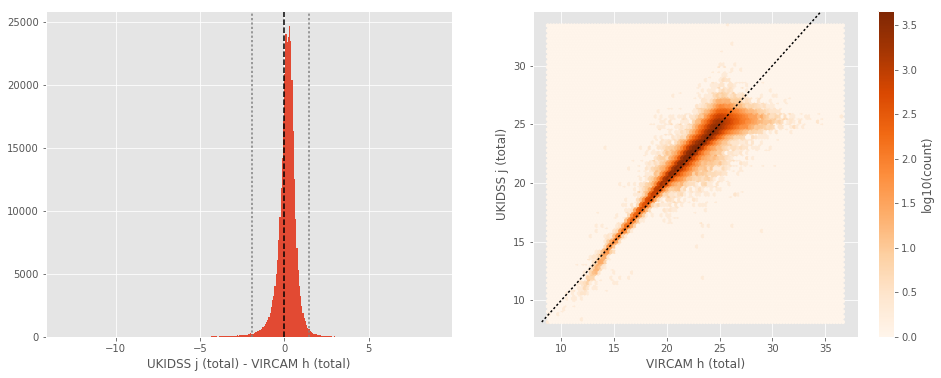

UKIDSS j (aperture) - VIRCAM k (aperture):
- Median: 0.55
- Median Absolute Deviation: 0.33
- 1% percentile: -1.8585863494873045
- 99% percentile: 1.8937459564208996


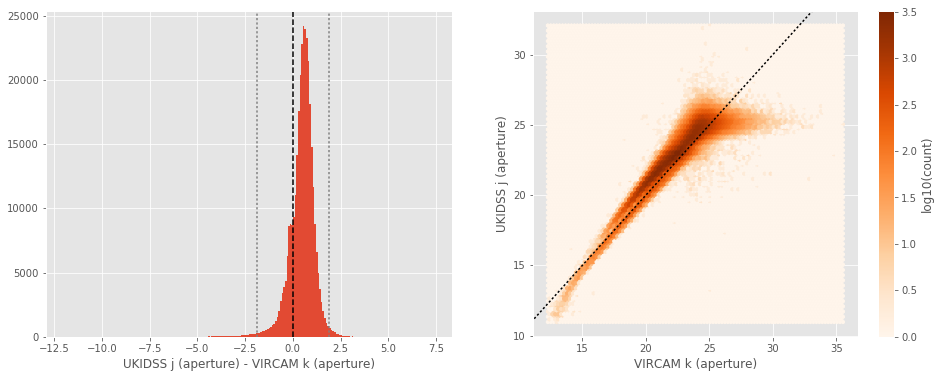

UKIDSS j (total) - VIRCAM k (total):
- Median: 0.40
- Median Absolute Deviation: 0.38
- 1% percentile: -1.9898881912231445
- 99% percentile: 1.8312970161437994


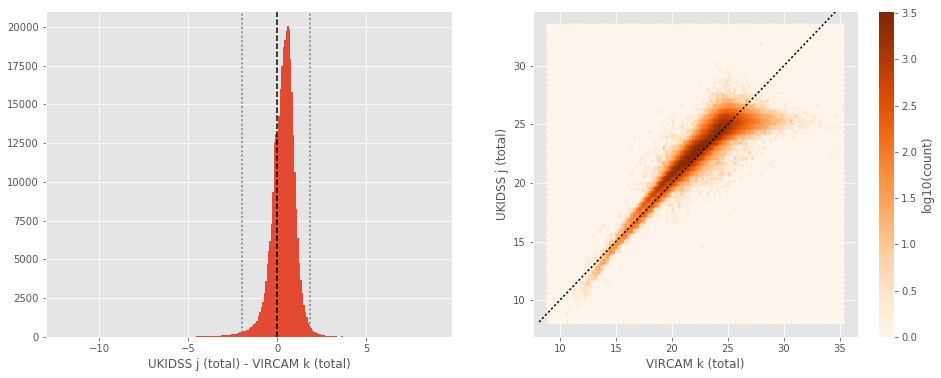

In [10]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, j_bands, h_bands, k_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [11]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [12]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_XMM-LSS.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

Megacam u (aperture) - SDSS u (fiberMag):
- Median: -0.16
- Median Absolute Deviation: 0.56
- 1% percentile: -2.275182304382324
- 99% percentile: 3.3625221252441406


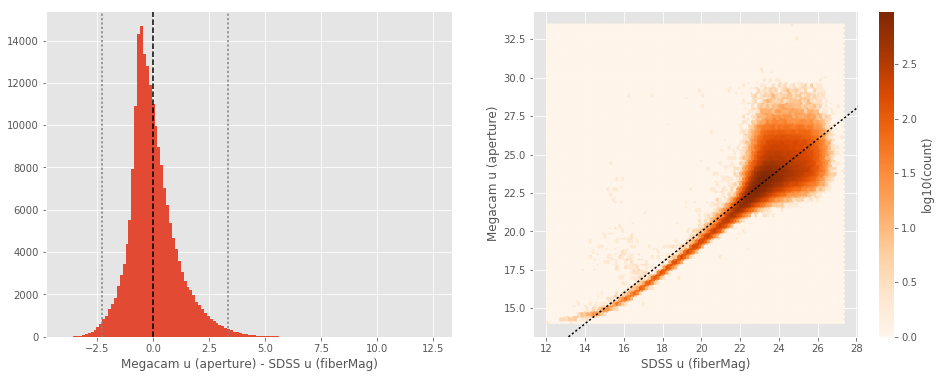

Megacam u (total) - SDSS u (petroMag):
- Median: -0.16
- Median Absolute Deviation: 0.56
- 1% percentile: -2.275182304382324
- 99% percentile: 3.3625221252441406


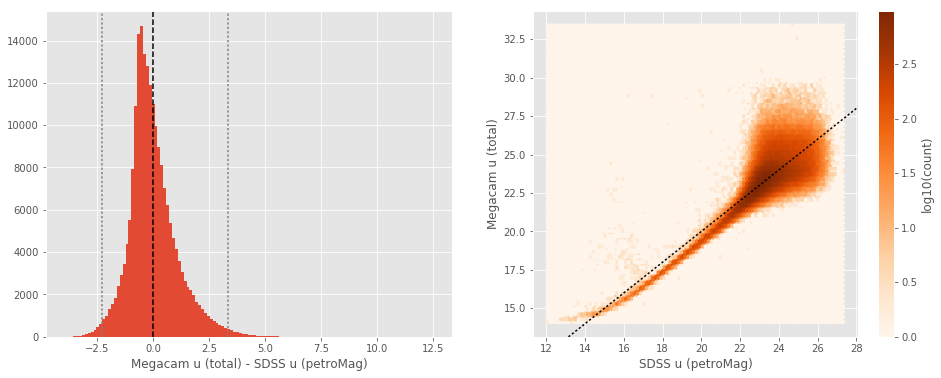

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.34
- Median Absolute Deviation: 0.13
- 1% percentile: -1.124325294494629
- 99% percentile: 0.9107969665527345


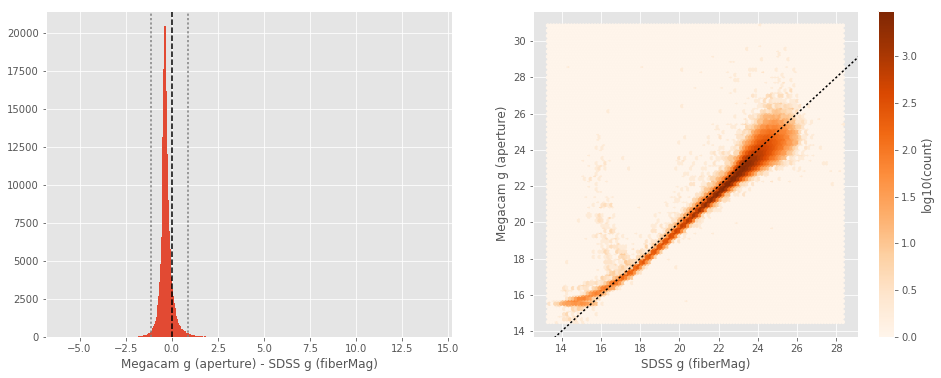

Megacam g (total) - SDSS g (petroMag):
- Median: -0.34
- Median Absolute Deviation: 0.13
- 1% percentile: -1.124325294494629
- 99% percentile: 0.9107969665527345


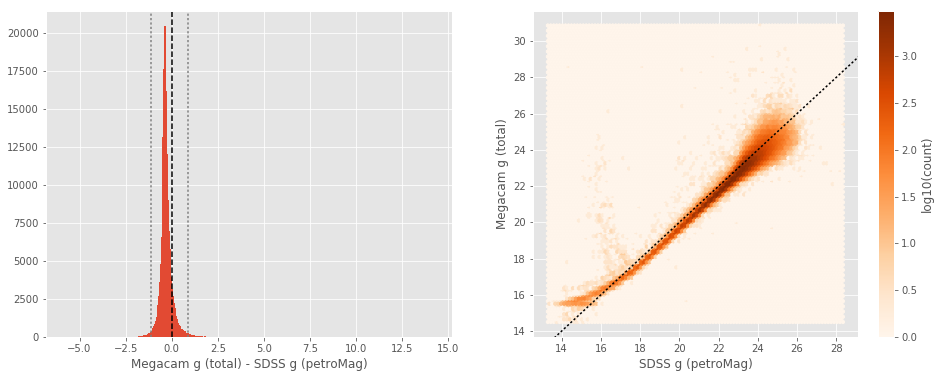

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1427298736572264
- 99% percentile: 1.4442640686035149


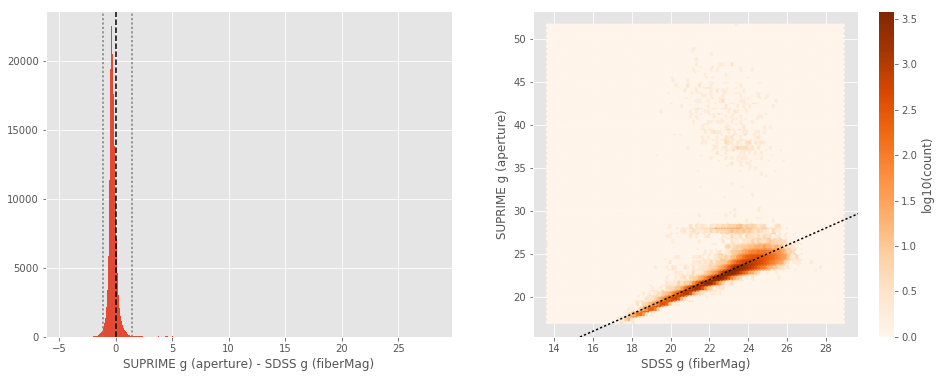

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.30
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1427298736572264
- 99% percentile: 1.4442640686035149


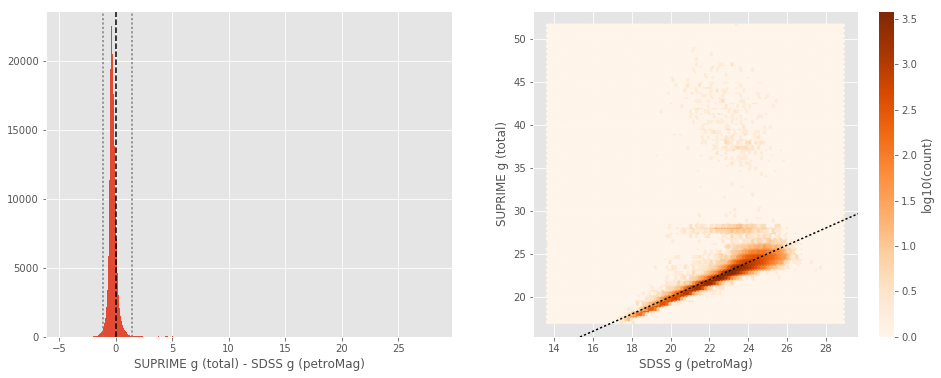

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.56
- Median Absolute Deviation: 0.26
- 1% percentile: -2.621855392456055
- 99% percentile: 1.6956641387939437


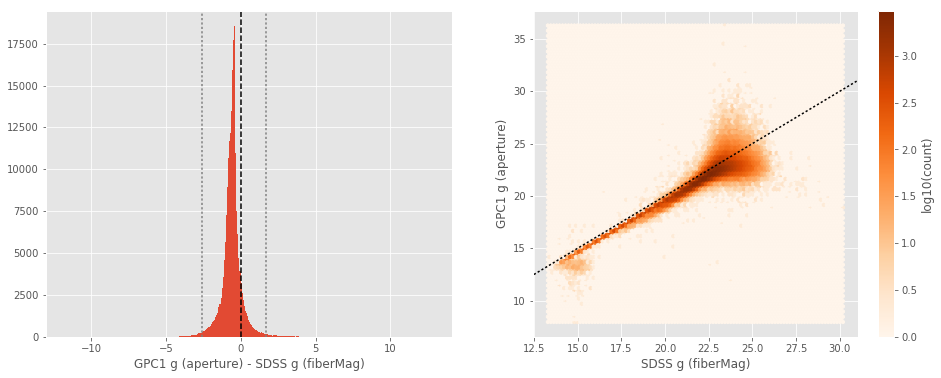

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.56
- Median Absolute Deviation: 0.26
- 1% percentile: -2.621855392456055
- 99% percentile: 1.6956641387939437


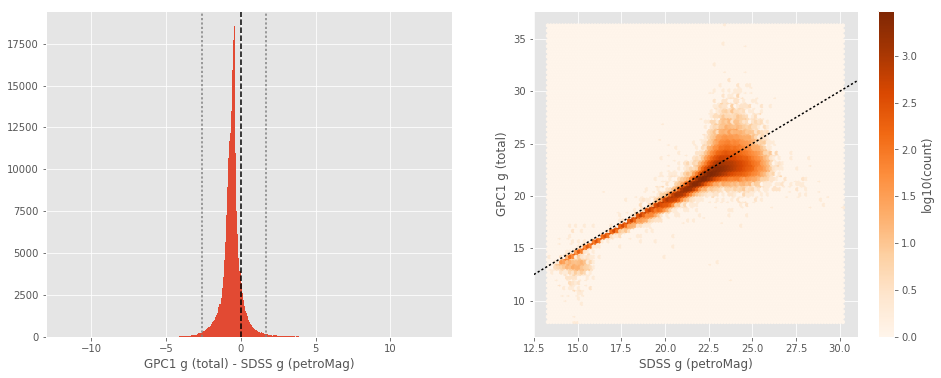

DECam g (aperture) - SDSS g (fiberMag):
- Median: -0.47
- Median Absolute Deviation: 0.15
- 1% percentile: -1.244184684753418
- 99% percentile: 1.0085596084594715


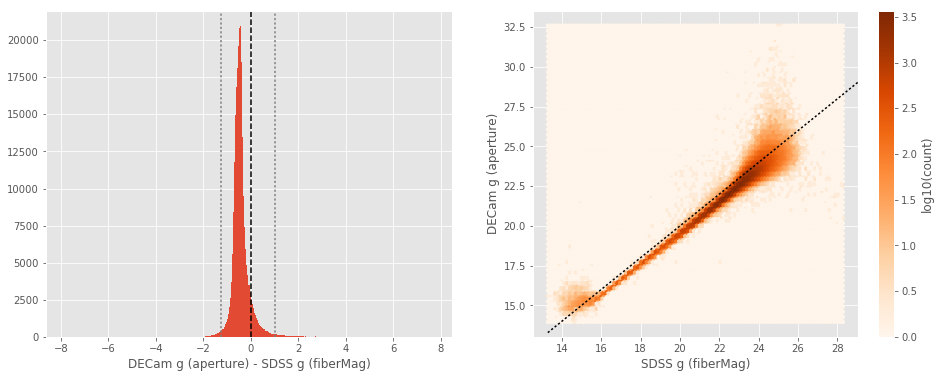

DECam g (total) - SDSS g (petroMag):
- Median: -0.47
- Median Absolute Deviation: 0.15
- 1% percentile: -1.244184684753418
- 99% percentile: 1.0085596084594715


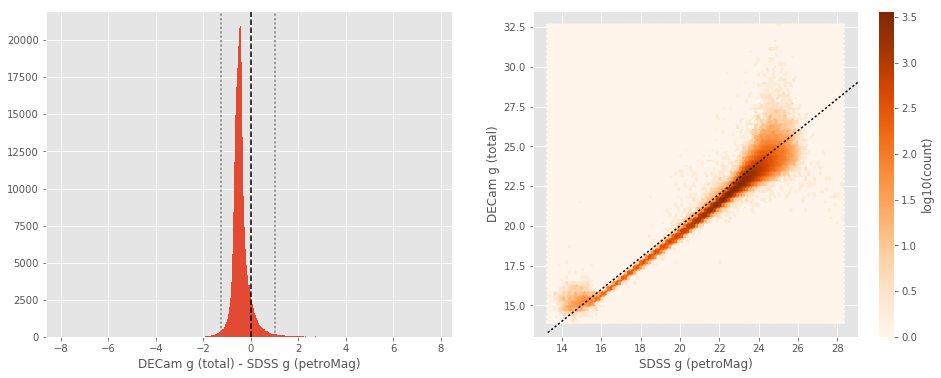

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.27
- Median Absolute Deviation: 0.09
- 1% percentile: -0.9249799919128417
- 99% percentile: 0.538681001663208


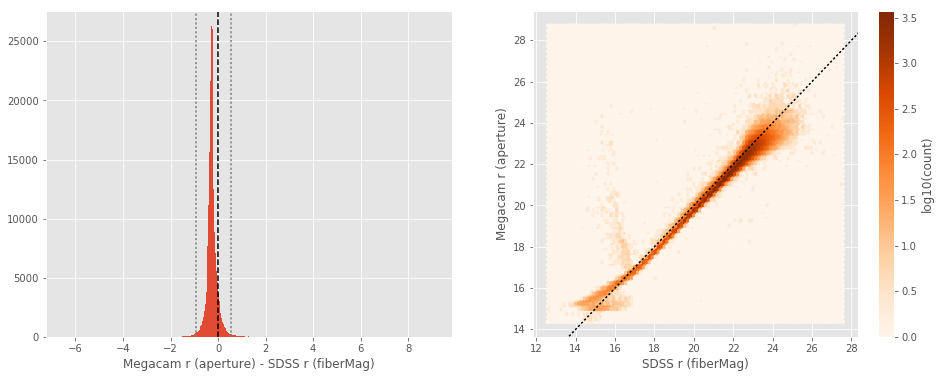

Megacam r (total) - SDSS r (petroMag):
- Median: -0.27
- Median Absolute Deviation: 0.09
- 1% percentile: -0.9249799919128417
- 99% percentile: 0.538681001663208


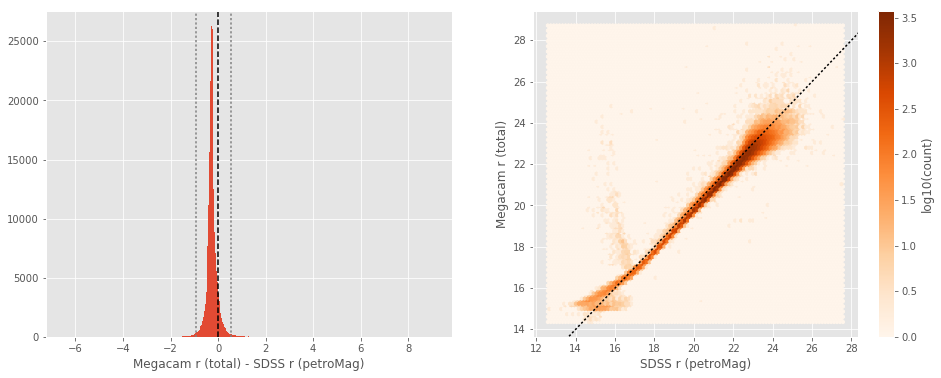

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9901150512695311
- 99% percentile: 1.1704694557189843


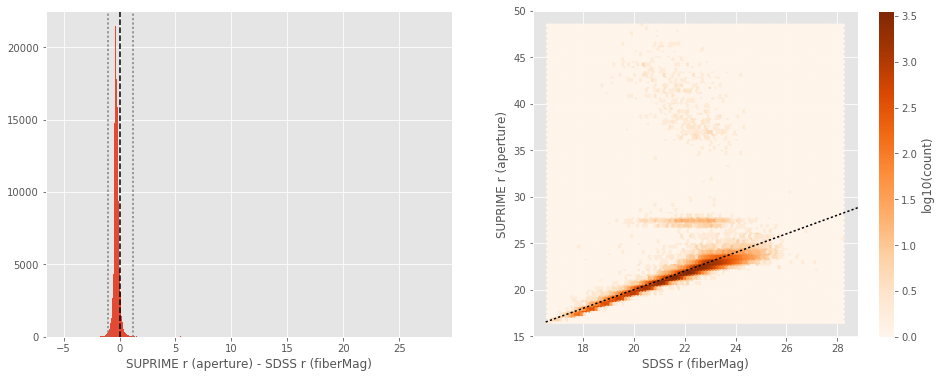

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.29
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9901150512695311
- 99% percentile: 1.1704694557189843


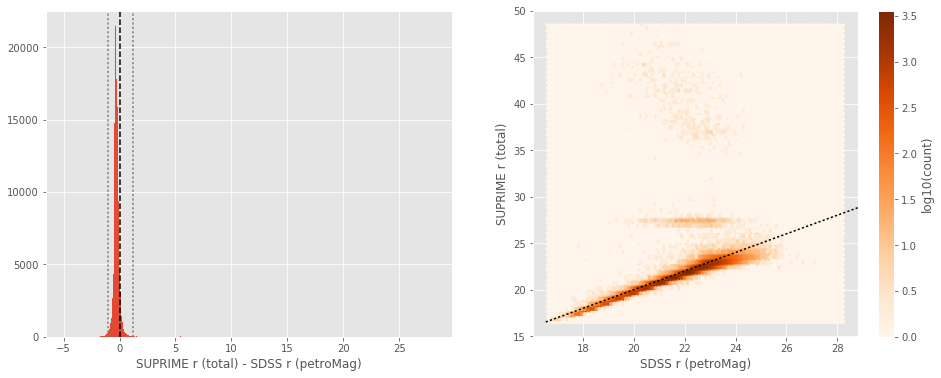

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.43
- Median Absolute Deviation: 0.17
- 1% percentile: -1.6574333953857423
- 99% percentile: 0.9487327003478969


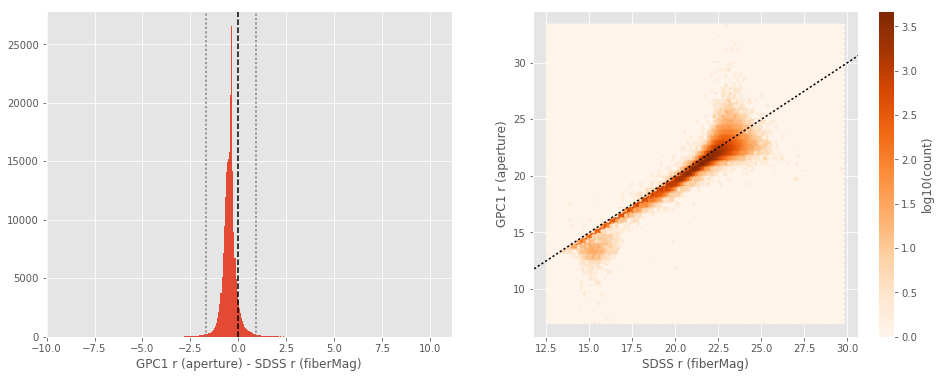

GPC1 r (total) - SDSS r (petroMag):
- Median: -0.43
- Median Absolute Deviation: 0.17
- 1% percentile: -1.6574333953857423
- 99% percentile: 0.9487327003478969


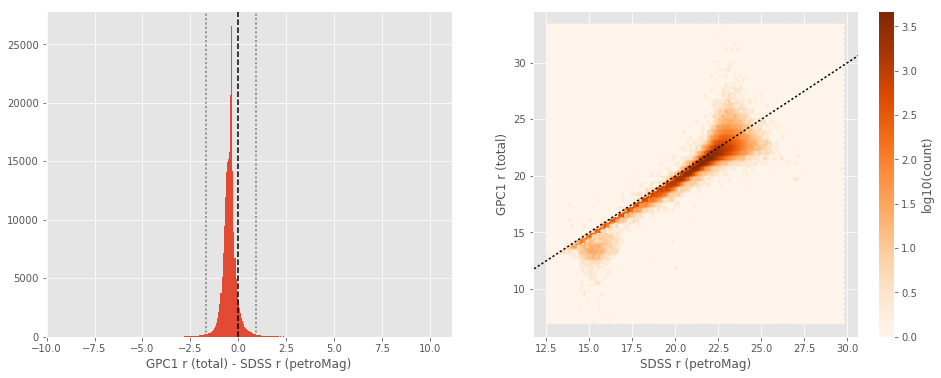

DECam r (aperture) - SDSS r (fiberMag):
- Median: -0.54
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2241885185241699
- 99% percentile: 0.7106982612609866


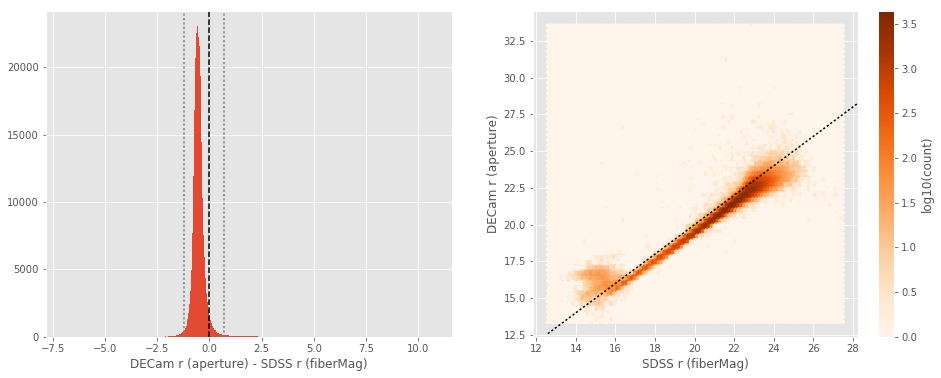

DECam r (total) - SDSS r (petroMag):
- Median: -0.54
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2241885185241699
- 99% percentile: 0.7106982612609866


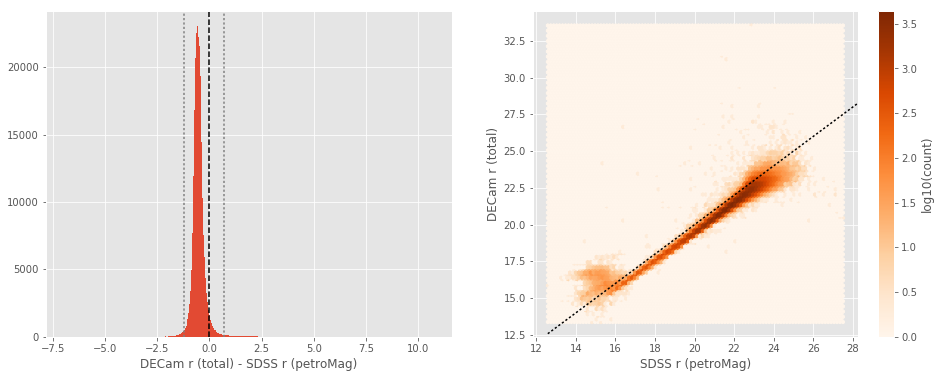

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.30
- Median Absolute Deviation: 0.13
- 1% percentile: -0.944521141052246
- 99% percentile: 4.506950340271012


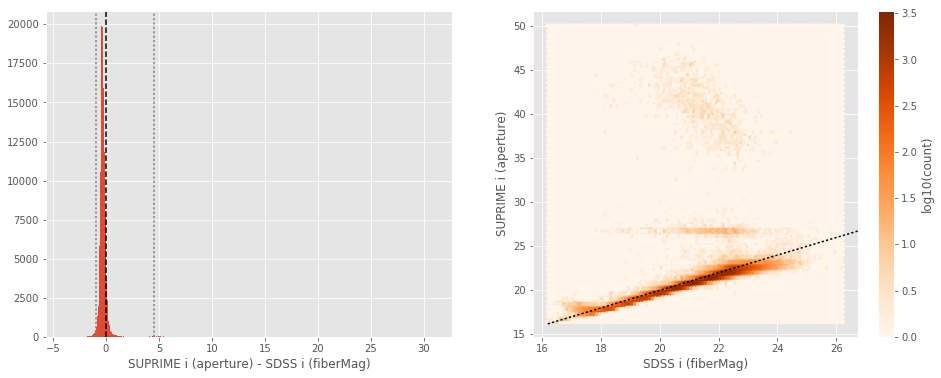

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.30
- Median Absolute Deviation: 0.13
- 1% percentile: -0.944521141052246
- 99% percentile: 4.506950340271012


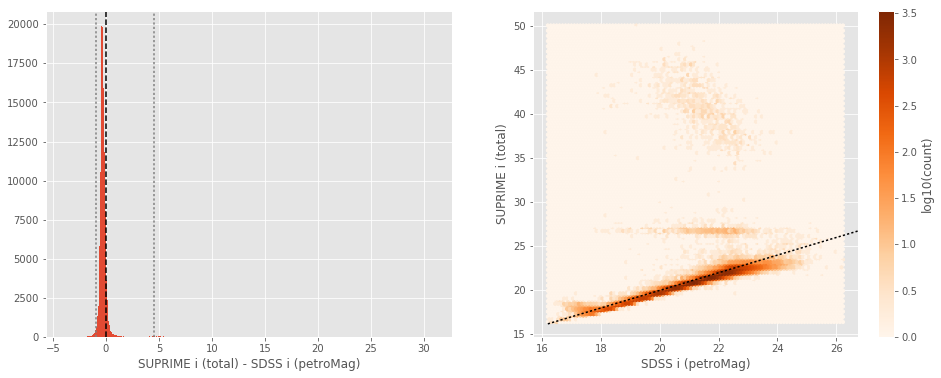

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.41
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1643628311157226
- 99% percentile: 0.2622515487670894


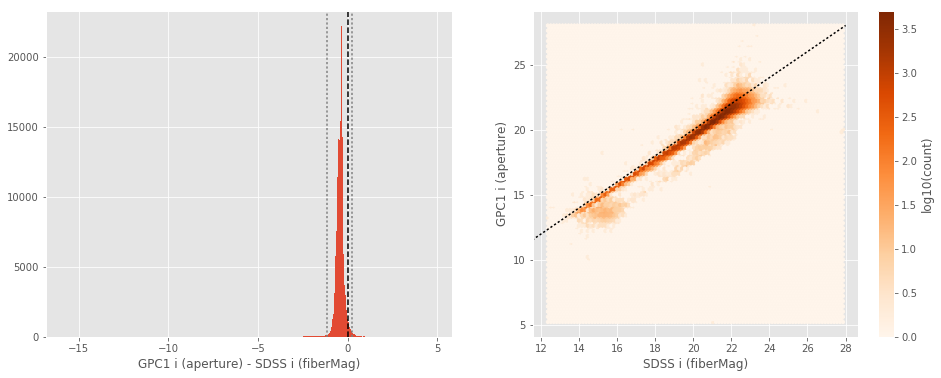

GPC1 i (total) - SDSS i (petroMag):
- Median: -0.41
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1643628311157226
- 99% percentile: 0.2622515487670894


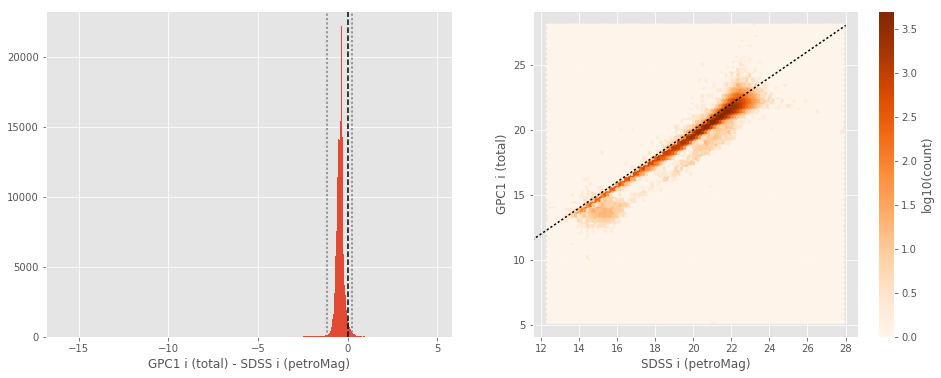

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.17
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1768099784851074
- 99% percentile: 1.1184026050567626


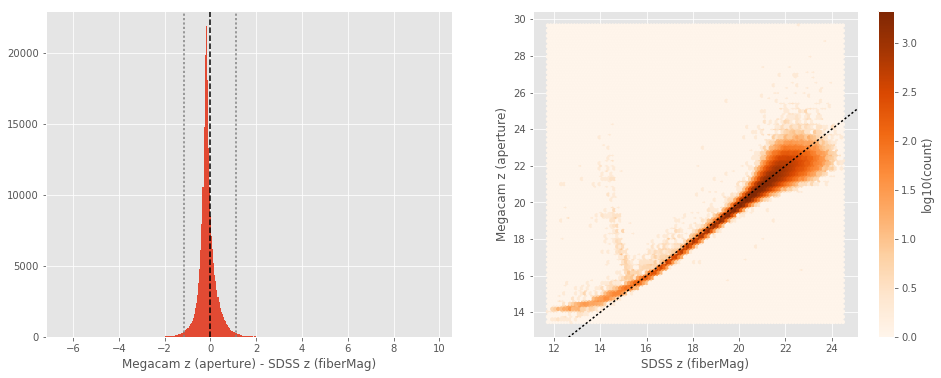

Megacam z (total) - SDSS z (petroMag):
- Median: -0.17
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1768099784851074
- 99% percentile: 1.1184026050567626


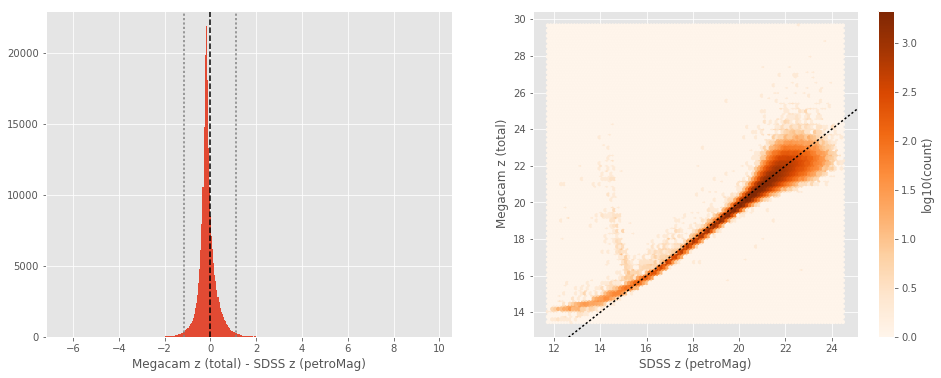

SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.21
- Median Absolute Deviation: 0.19
- 1% percentile: -1.2232777976989746
- 99% percentile: 1.9618323898315522


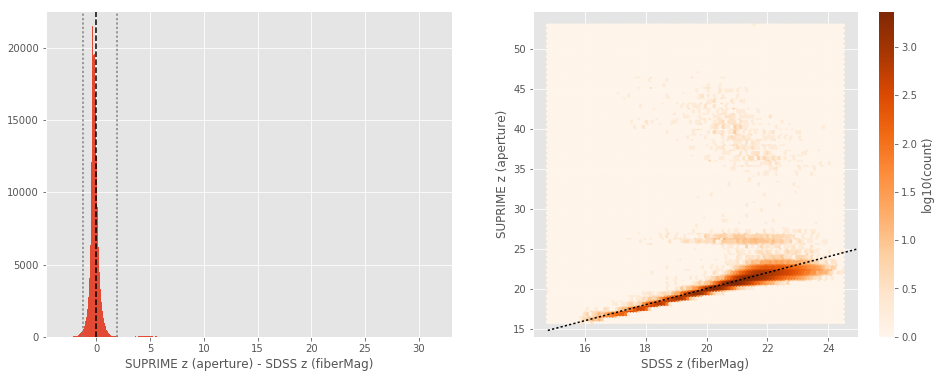

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.21
- Median Absolute Deviation: 0.19
- 1% percentile: -1.2232777976989746
- 99% percentile: 1.9618323898315522


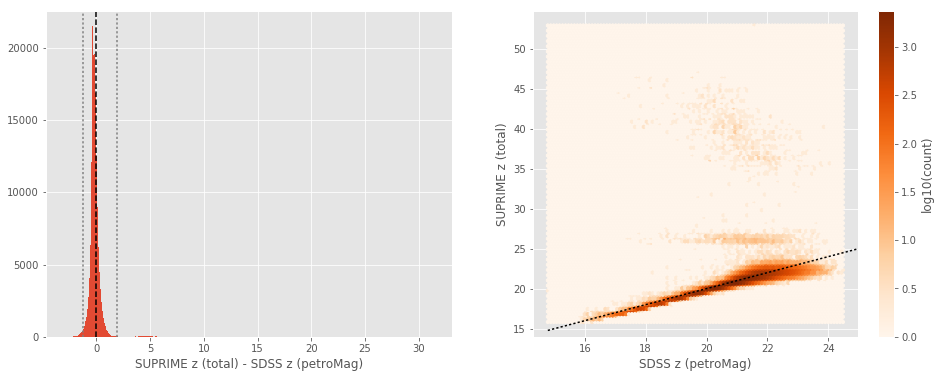

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.31
- Median Absolute Deviation: 0.16
- 1% percentile: -1.5094172859191894
- 99% percentile: 0.8233450889587486


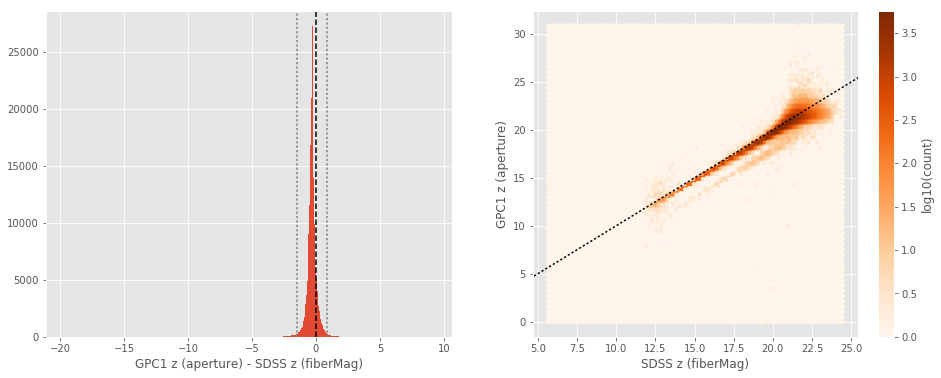

GPC1 z (total) - SDSS z (petroMag):
- Median: -0.31
- Median Absolute Deviation: 0.16
- 1% percentile: -1.5094172859191894
- 99% percentile: 0.8233450889587486


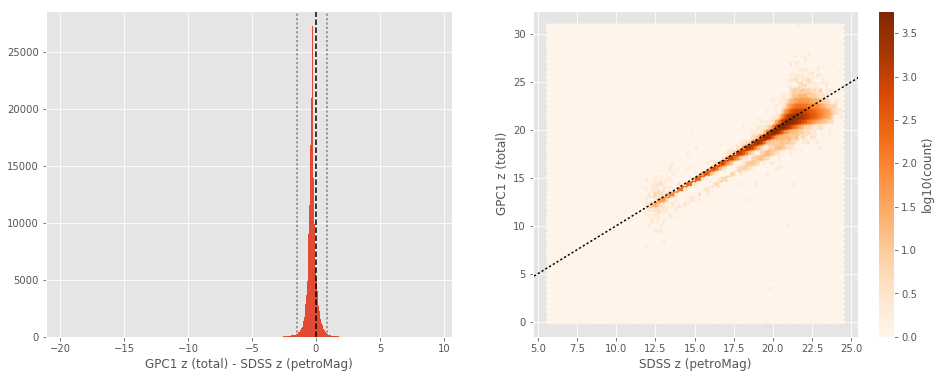

DECam z (aperture) - SDSS z (fiberMag):
- Median: -0.45
- Median Absolute Deviation: 0.18
- 1% percentile: -1.4926085090637207
- 99% percentile: 1.8611146831512486


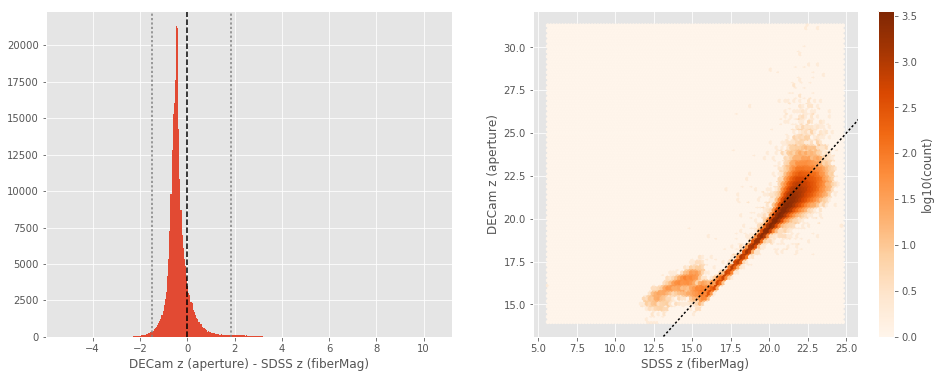

DECam z (total) - SDSS z (petroMag):
- Median: -0.45
- Median Absolute Deviation: 0.18
- 1% percentile: -1.4926085090637207
- 99% percentile: 1.8611146831512486


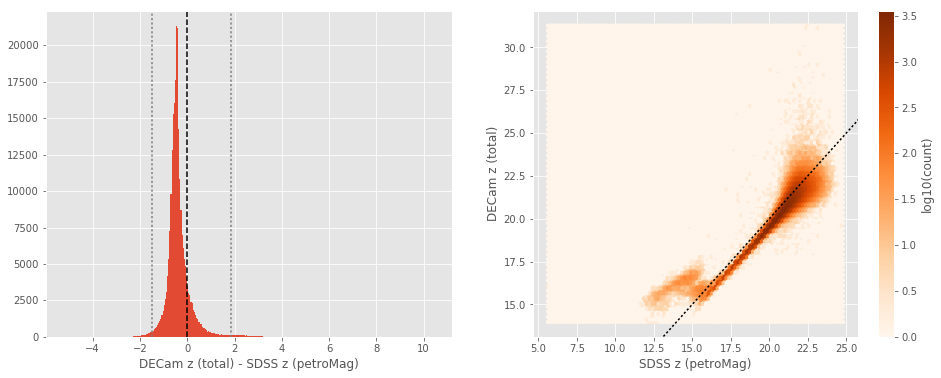

VIRCAM z (aperture) - SDSS z (fiberMag):
- Median: -0.18
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1820927810668946
- 99% percentile: 7.613719787597657


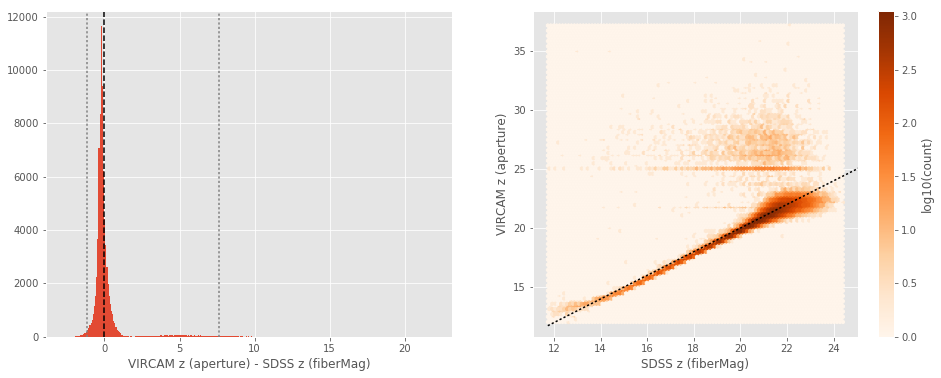

VIRCAM z (total) - SDSS z (petroMag):
- Median: -0.18
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1820927810668946
- 99% percentile: 7.613719787597657


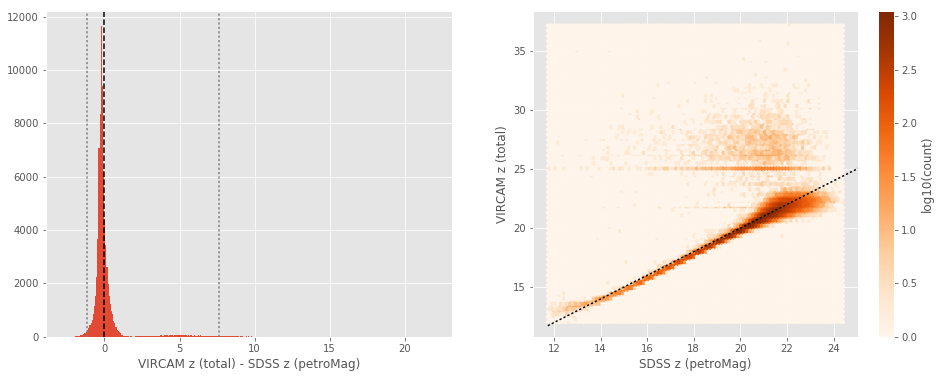

In [13]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1].lower())]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1].lower())]
        master_cat_mag_tot = master_catalogue["m_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        nb_compare_mags(sdss_mag_tot, master_cat_mag_tot,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [14]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [15]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_XMM-LSS.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.02
- Median Absolute Deviation: 0.07
- 1% percentile: -1.0929408017637088
- 99% percentile: 0.6913616157625345


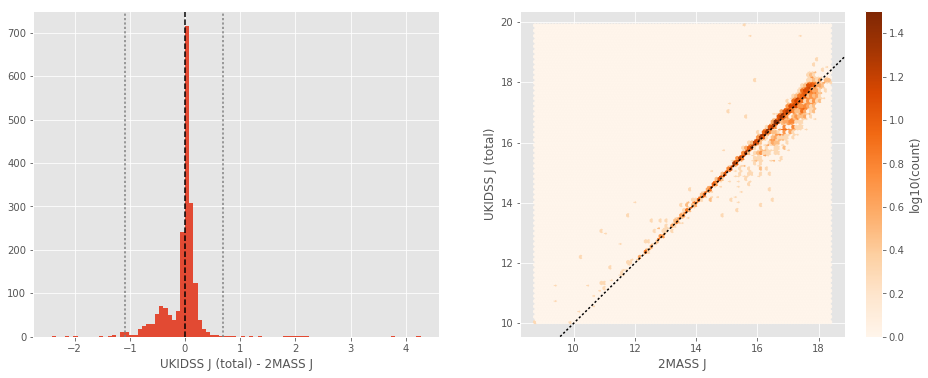

In [16]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.07
- Median Absolute Deviation: 0.11
- 1% percentile: -1.0088261194475698
- 99% percentile: 1.0918024134198605


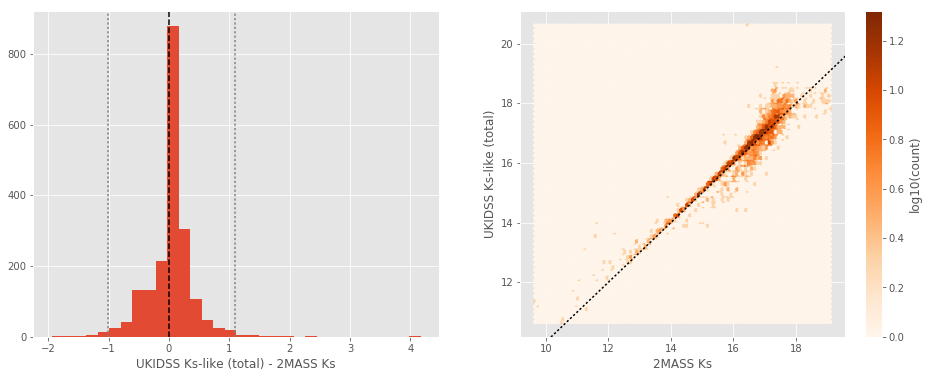

In [17]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

WIRCAM J (total) - 2MASS J:
- Median: -0.01
- Median Absolute Deviation: 0.08
- 1% percentile: -1.6887039037992306
- 99% percentile: 2.8399360962007716


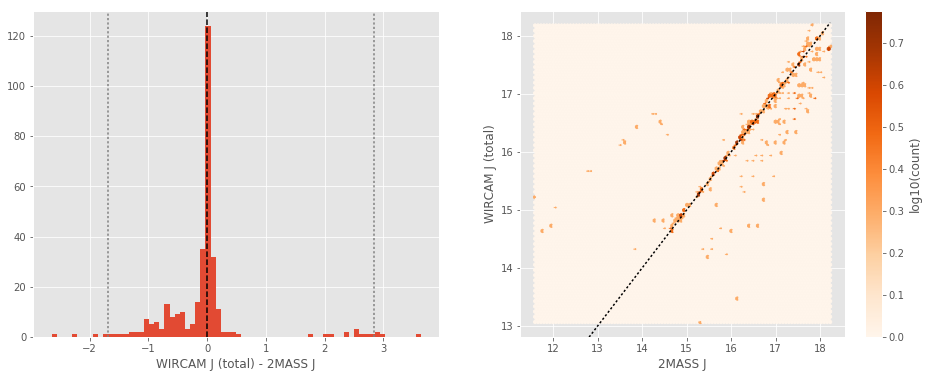

In [18]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_wirds_j'][ml_twomass_idx],
                labels=("2MASS J", "WIRCAM J (total)"))

WIRCAM Ks (total) - 2MASS Ks:
- Median: -0.01
- Median Absolute Deviation: 0.13
- 1% percentile: -1.671212484468322
- 99% percentile: 2.357890515531679


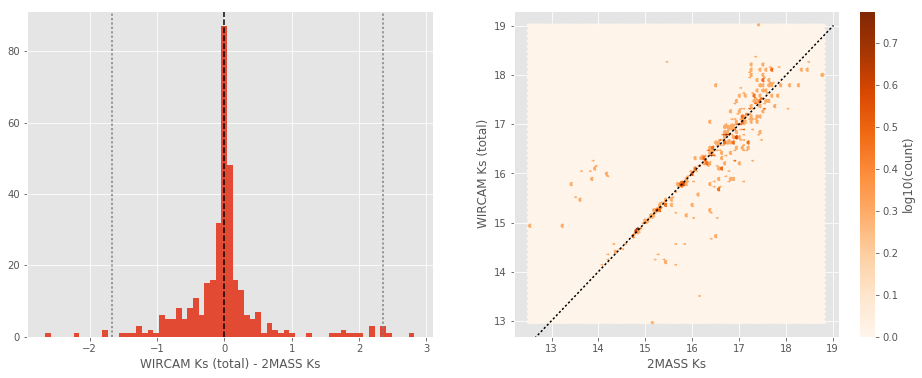

In [19]:
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, master_catalogue['m_wirds_ks'][ml_twomass_idx],
                labels=("2MASS Ks", "WIRCAM Ks (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 4126581 / 8717327 (47.34%)
Number of source used: 4718862 / 8717327 (54.13%)
Number of source used: 373246 / 8717327 (4.28%)
Number of source used: 1744740 / 8717327 (20.01%)


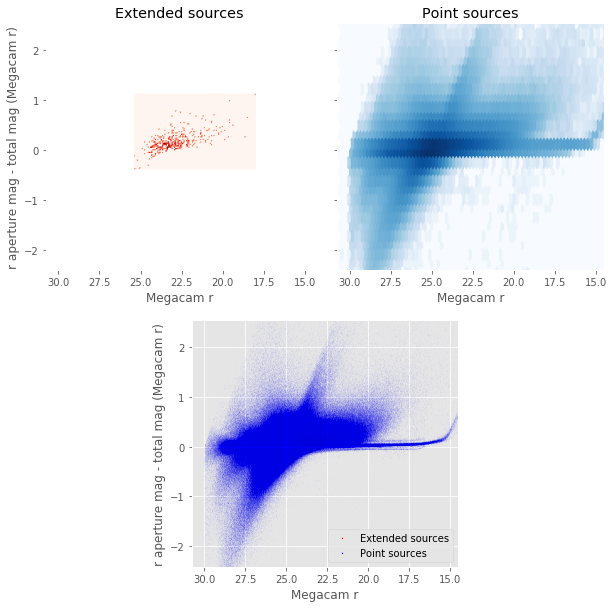

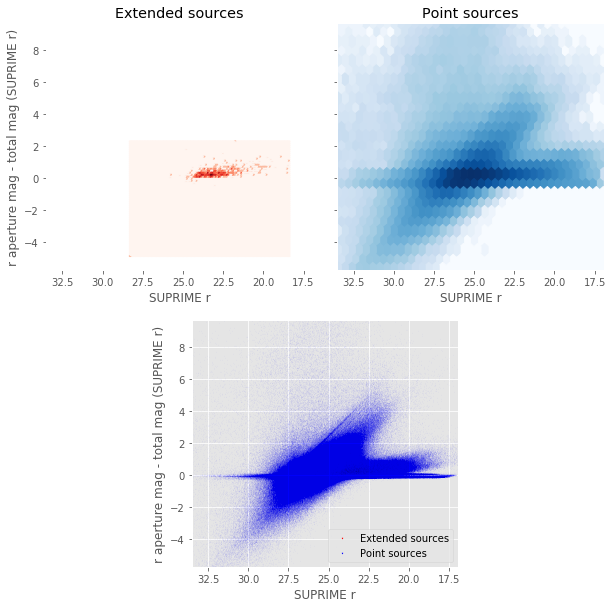

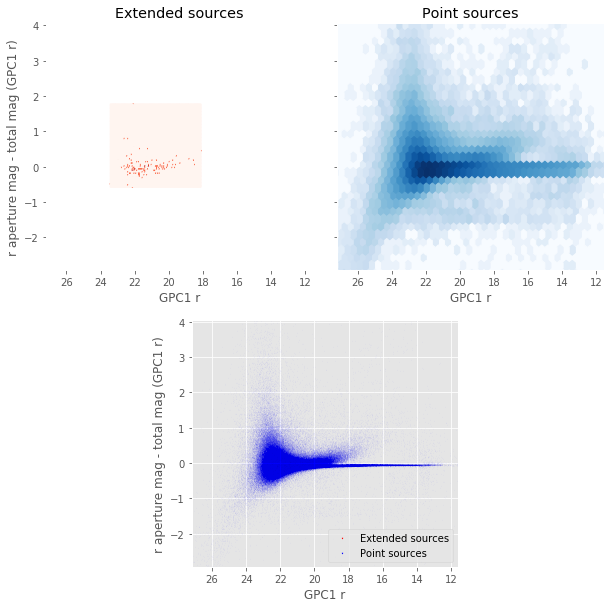

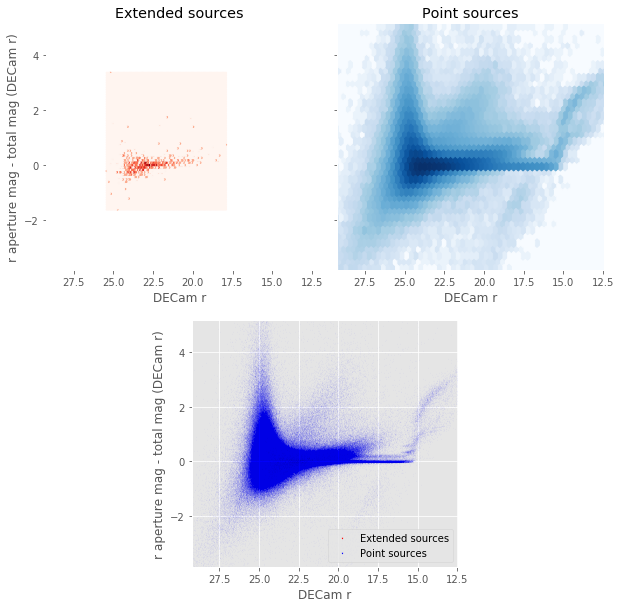

In [20]:
for band in r_bands:
    nb_ccplots(
        master_catalogue["m_{}".format(band.replace(" ", "_").lower())],
        master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())] - master_catalogue["m_{}".format(band.replace(" ", "_").lower())],
        band, "r aperture mag - total mag ({})".format(band),
        master_catalogue["stellarity"],
        invert_x=True
    )

## V - Color-color and magnitude-color plots

Number of source used: 395116 / 8717327 (4.53%)


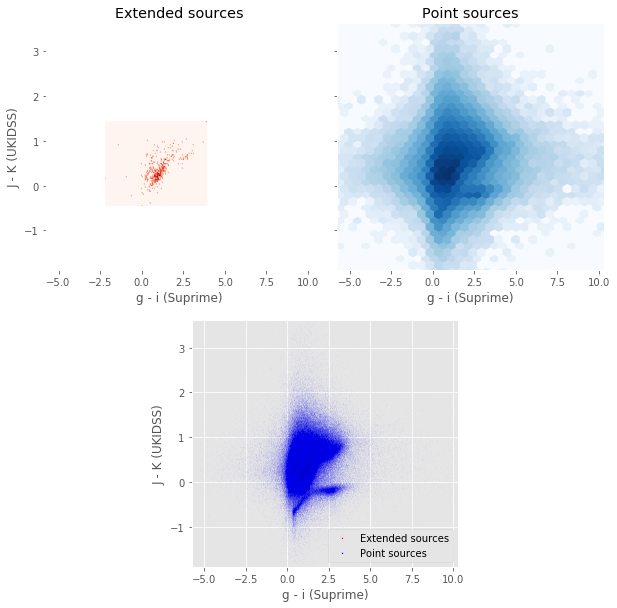

In [21]:
nb_ccplots(
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (Suprime)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 708406 / 8717327 (8.13%)


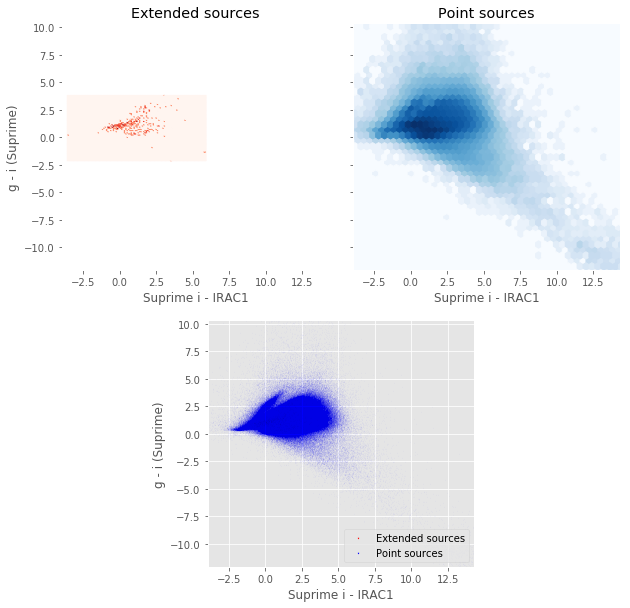

In [22]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_irac_i1'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    "Suprime i - IRAC1", "g - i (Suprime)",
    master_catalogue["stellarity"]
)

Number of source used: 3615206 / 8717327 (41.47%)


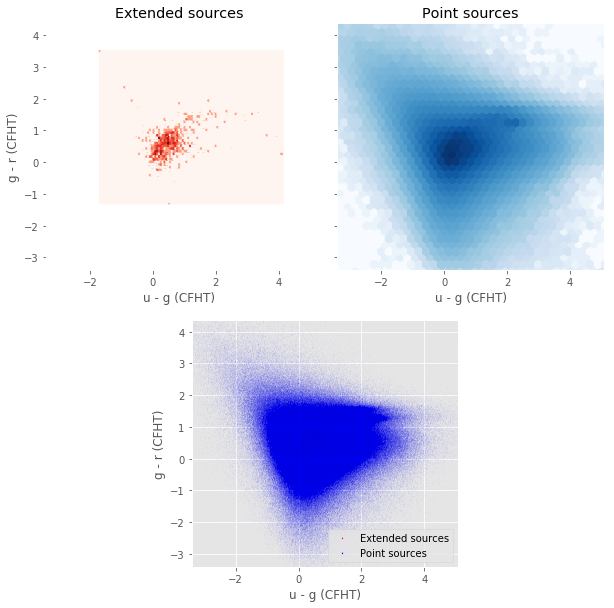

In [23]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 398239 / 8717327 (4.57%)


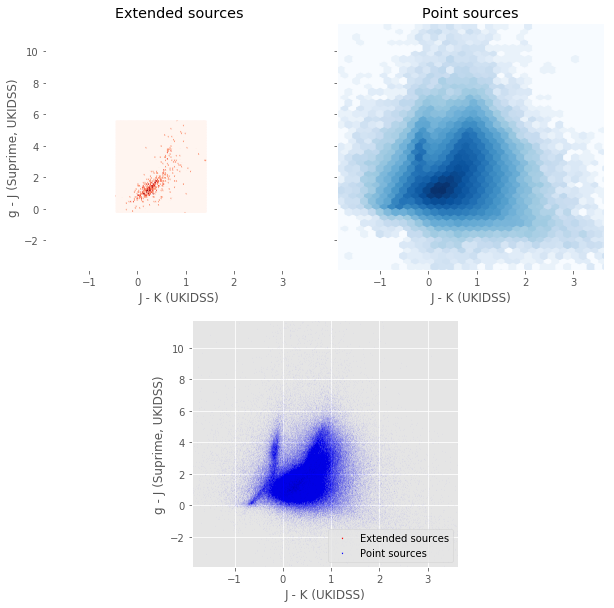

In [24]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (Suprime, UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 421209 / 8717327 (4.83%)


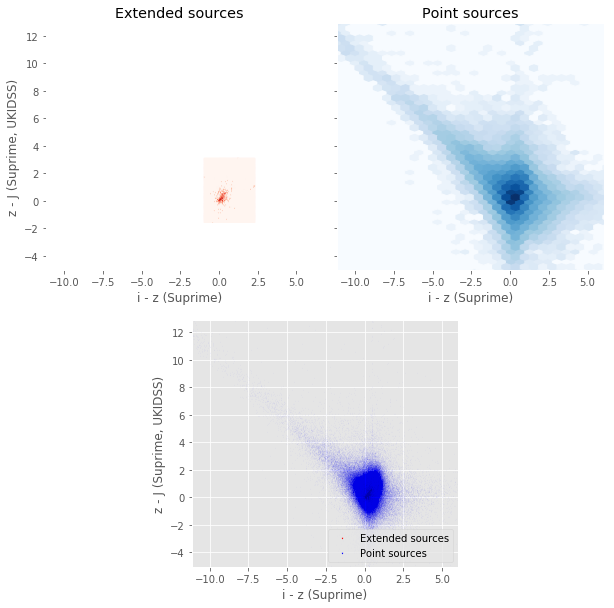

In [25]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_suprime_z'],
    master_catalogue['m_suprime_z'] - master_catalogue['m_ukidss_j'],
    "i - z (Suprime)", "z - J (Suprime, UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 23470 / 8717327 (0.27%)


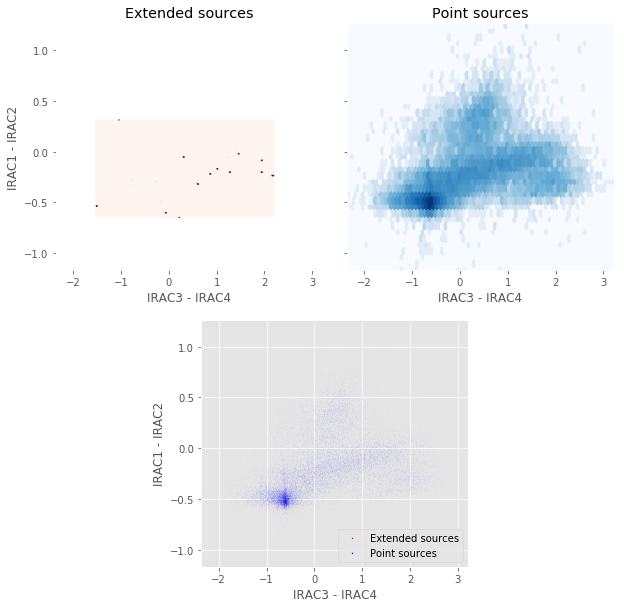

In [26]:
nb_ccplots(
    master_catalogue['m_irac_i3'] - master_catalogue['m_irac_i4'],
    master_catalogue['m_irac_i1'] - master_catalogue['m_irac_i2'],
    "IRAC3 - IRAC4", "IRAC1 - IRAC2",
    master_catalogue["stellarity"]
)